In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Imports

In [ ]:
! pip install "transformers" "pytorch-lightning"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import json
import pandas as pd
import numpy as np
import time
import heapq

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt
%matplotlib inline 
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer

In [ ]:
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn as nn

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
device = 0
if torch.cuda.is_available():    
    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")
    print('There are %d GPU(s) available.' % torch.cuda.device_count())
    print('We will use the GPU:', torch.cuda.get_device_name(0))
# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

No GPU available, using the CPU instead.


In [ ]:
# likes_path = "/content/drive/MyDrive/Tesi/easytour-likes-2022-03MAR-21.json"
# schede_path = "/content/drive/MyDrive/Tesi/easytour-schede-2022-03MAR-21.json"
# data_path = "/content/drive/MyDrive/Tesi/data.csv"

In [ ]:
# likes_path = "/content/drive/MyDrive/Tesi/kuriu-likes-apr.json"
# schede_path = "/content/drive/MyDrive/Tesi/kuriu-schede-apr.json"
# data_path = "/content/drive/MyDrive/Tesi/data-APR.csv"

In [ ]:
likes_path = "/content/drive/MyDrive/Tesi/kuriu-likes-2022-06JUN-18.json"
schede_path = "/content/drive/MyDrive/Tesi/kuriu-schede-2022-06JUN-18.json"
data_path = "/content/drive/MyDrive/Tesi/data-JUN.csv"

In [ ]:
df_schede = pd.read_json(schede_path)
df_likes = pd.read_json(likes_path)
data = pd.read_csv(data_path, encoding_errors='ignore')  

In [ ]:
#categories = ["aria aperta", "cultura", "food", "sport", "tempo libero", "viaggi"]
categories = ["aria aperta", "cultura",	"eventi culinari", "food", "food all'aperto", "food drink",	"sport",	"tempo libero", "travel",	"viaggi"]

In [ ]:
df_schede_fields = df_schede[["id","userId", "title", "description", "duration", "datePublishing", "creationDate", "categories", "viewCounter"]]
df_likes_ids = df_likes[["documentId", "authorId"]]

In [ ]:
df_schede

,id,userId,userName,documentType,title,description,locations,duration,imageId,previewId,...,version,media,shareType,status,lastUpdate,versionHistory,viewCounter,device,crowdPosting,activeCrowdPosting
0,62349ff2272ae5672fbc3135,632,Forestlife_Adventure,experience,"Big Buddha, Phuket 🇹🇭",Phuket è conosciuta per essere la meta predile...,[{'photoReference': 'Aap_uEA4LhCYzVzbaHBUWsYoz...,0,62349c0c272ae5672fbc30d6,None,...,5,{'photos': [{'fileId': '62349c0c272ae5672fbc30...,SHARED,PUBLISHED,2022-04-20T12:54:13.563Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",18,"{'deviceModel': 'Xiaomi Mi 9T', 'deviceOS': 'A...",NaN,False
1,6234aa65272ae5672fbc34c2,632,Forestlife_Adventure,experience,"Wat Chalong, il tempio più venerato di Phuket 🇹🇭","Phuket non è solo spiagge, ci sono anche altri...",[{'photoReference': 'Aap_uEDR-tkPt3POWYoKoWcHy...,0,6234a758272ae5672fbc32aa,None,...,5,{'photos': [{'fileId': '6234a758272ae5672fbc32...,SHARED,PUBLISHED,2022-04-20T12:54:13.586Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",16,"{'deviceModel': 'Xiaomi Mi 9T', 'deviceOS': 'A...",NaN,False
2,620aa536ff8ae67f37cafb06,442,lollo_cata,experience,Accarezzare le tigri,So che dietro queste cose c’è spesso del marci...,[{'photoReference': 'Aap_uEBCcOt7F8m6JNGvUZJOR...,10800000,620aa384ff8ae67f37cafaf9,None,...,7,{'photos': [{'fileId': '620aa384ff8ae67f37cafa...,SHARED,PUBLISHED,2022-02-14T20:05:09.362Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",426,"{'deviceModel': 'iPhone 13', 'deviceOS': 'iOS'...",NaN,False
3,624e5982ec9ff859ff529ce8,571,tiportoviaconme,experience,"Yangon, la capitale storica del Myanmar",Probabilmente Yangon sarà il punto d’inizio se...,[{'photoReference': 'Aap_uEDCSLsqxhvyp9pUEmR5R...,0,624e5916ec9ff859ff529c90,None,...,3,{'photos': [{'fileId': '624e5916ec9ff859ff529c...,SHARED,PUBLISHED,2022-04-07T03:24:50.535Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",6,"{'deviceModel': 'OPPO CPH1907', 'deviceOS': 'A...",NaN,False
4,620abb33ff8ae67f37cafe3c,442,lollo_cata,experience,Freedom beach,Forse la spiaggia più bella di tutta l’isola d...,[{'photoReference': 'Aap_uECP3iO80ReEkce8JB_2s...,18000000,620ab9e4ff8ae67f37cafe30,None,...,8,{'photos': [{'fileId': '620ab9e4ff8ae67f37cafe...,SHARED,PUBLISHED,2022-02-14T20:27:31.966Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",424,"{'deviceModel': 'iPhone 13', 'deviceOS': 'iOS'...",NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,6213b3460f41f86438b07d9c,429,Elle_,experience,"Machu Picchu, meraviglia del mondo","È l’alba, ma la realtà è che in questo viaggio...",[{'photoReference': 'Aap_uEASvi2g7Xd91-_ojmvmi...,21600000,6213b3000f41f86438b07cad,None,...,6,{'photos': [{'fileId': '6213b3000f41f86438b07c...,SHARED,PUBLISHED,2022-04-22T14:14:59.961Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",47,"{'deviceModel': 'iPhone 8', 'deviceOS': 'iOS',...",NaN,False
5720,61dd867f9c823e129b1f2cc2,429,Elle_,experience,I segreti di Moray,Sembra la prova schiacciante dell’esistenza de...,[{'photoReference': 'Aap_uEBZ0EHCQ9HgiQWe89I7L...,7200000,61dd860e9c823e129b1f2c7b,None,...,6,{'photos': [{'fileId': '61dd860e9c823e129b1f2c...,SHARED,PUBLISHED,2022-04-22T14:14:59.815Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",95,None,NaN,False
5721,61e0146111b3bf4d3185ad5d,427,teretacchi,experience,"Machu Picchu, tra storia e meraviglia",Sono passati dieci (!) anni dalla mia esperien...,[{'photoReference': 'Aap_uECe7KHh6UtQvIdb8g3JL...,16200000,61e0134011b3bf4d3185ad2f,None,...,6,{'photos': [{'fileId': '61e0134011b3bf4d3185ad...,SHARED,PUBLISHED,2022-01-13T12:04:33.749Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",63,None,NaN,False
5722,6273a0a9dd67f6198e5ac192,606,DaleOnTravel,experience,Come arrivare a Machu Picchu: modalità e tempi,Sembrerà un argomento banale: vuoi che sia dif...,[{'photoReference': 'Aap_uEBtY1EzLnQqBMoci7nIs...,0,6273a0a7dd67f6198e5ac165,6273a03add67f6198e5ac12c,...,2,{'photos': [{'fileId': '6273a0a7

In [ ]:
data

,id,userId,title,description,duration,datePublishing,creationDate,categories,viewCounter,Unnamed: 9,...,food all'aperto,food drink,sport,tempo libero,travel,viaggi,title_processed,description_processed,duration_min,days
0,62349ff2272ae5672fbc3135,632,"Big Buddha, Phuket 🇹🇭",Phuket è conosciuta per essere la meta predile...,0,2022-03-19T04:48:49.248Z,2022-03-18T15:06:26.000+00:00,['Viaggi'],18,0,...,0,0,0,0,0,1,"['big', 'buddh']","['met', 'turist', 'assalt', 'spiagg', 'acqua',...",0.0,130
1,6234aa65272ae5672fbc34c2,632,"Wat Chalong, il tempio più venerato di Phuket 🇹🇭","Phuket non è solo spiagge, ci sono anche altri...",0,2022-03-19T04:04:27.356Z,2022-03-18T15:51:01.000+00:00,['Viaggi'],16,0,...,0,0,0,0,0,1,"['wat', 'chalong', 'temp', 'phuket']","['spiagg', 'pen', 'temp', 'wat', 'chalong', 'b...",0.0,130
2,620aa536ff8ae67f37cafb06,442,Accarezzare le tigri,So che dietro queste cose c’è spesso del marci...,10800000,2022-02-14T20:05:09.586Z,2022-02-14T18:53:42.000+00:00,['Viaggi'],426,0,...,0,0,0,0,0,1,['tigr'],"['marc', 'maltratt', 'animal', 'andar', 'scons...",180.0,162
3,624e5982ec9ff859ff529ce8,571,"Yangon, la capitale storica del Myanmar",Probabilmente Yangon sarà il punto d’inizio se...,0,2022-04-07T03:24:51.101Z,2022-04-07T03:24:50.000+00:00,['Viaggi'],6,0,...,0,0,0,0,0,1,"['capital', 'myanm']","['punt', 'iniz', 'viagg', 'myanm', 'preg', 'di...",0.0,111
4,620abb33ff8ae67f37cafe3c,442,Freedom beach,Forse la spiaggia più bella di tutta l’isola d...,18000000,2022-02-14T20:27:32.224Z,2022-02-14T20:27:31.000+00:00,['Viaggi'],424,0,...,0,0,0,0,0,1,['beac'],"['spiagg', 'isol', 'phuket', 'freedom', 'beac'...",300.0,162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,6213b3460f41f86438b07d9c,429,"Machu Picchu, meraviglia del mondo","È l’alba, ma la realtà è che in questo viaggio...",21600000,2022-02-21T15:44:06.580Z,2022-02-21T15:44:06.000+00:00,['Viaggi'],47,0,...,0,0,0,0,0,1,"['picchu', 'meravigl']","['alba', 'realt', 'viagg', 'rumor', 'casc', 'c...",360.0,155
5720,61dd867f9c823e129b1f2cc2,429,I segreti di Moray,Sembra la prova schiacciante dell’esistenza de...,7200000,2022-01-11T13:30:45.997Z,2022-01-11T13:30:39.000+00:00,['Aria aperta'],95,0,...,0,0,0,0,0,0,"['segret', 'moray']","['prov', 'esistt', 'alien', 'realt', 'stud', '...",120.0,197
5721,61e0146111b3bf4d3185ad5d,427,"Machu Picchu, tra storia e meraviglia",Sono passati dieci (!) anni dalla mia esperien...,16200000,2022-01-13T12:04:35.591Z,2022-01-13T12:00:33.000+00:00,['Cultura'],63,0,...,0,0,0,0,0,0,"['picchu', 'stor', 'meravigl']","['diec', 'esperit', 'machu', 'ricord', 'memor'...",270.0,195
5722,6273a0a9dd67f6198e5ac192,606,Come arrivare a Machu Picchu: modalità e tempi,Sembrerà un argomento banale: vuoi che sia dif...,0,2022-05-05T10:02:17.841Z,2022-05-05T10:02:17.000+00:00,['Viaggi'],7,0,...,0,0,0,0,0,1,"['machu', 'picchu', 'modal']","['argoment', 'meravigl', 'ebben', 'realt', 'in...",0.0,83


#User/likes distribution

In [ ]:
df_likes_ids.authorId.drop_duplicates().isin(data.userId.drop_duplicates())

0        True
1        True
2        True
4        True
5        True
        ...  
2252    False
2312     True
2415     True
2447     True
2488     True
Name: authorId, Length: 123, dtype: bool

In [ ]:
#list of users, some ids in likes are not in posts -> some users liked posts but not posted one
users = pd.concat([df_likes_ids.authorId, data.userId]).drop_duplicates() 
#list of posts' id
posts = data.id
#list of users and posts they made
users_posts = data.groupby("userId").id.apply(list)
#list of posts and users that liked that post
posts_with_likes = df_likes_ids.groupby("documentId").authorId.apply(list)
#list of users and posts they liked
users_with_likes = df_likes_ids.groupby("authorId").documentId.apply(list)
#users that have not posted anything
users_without_posts = users[~users.isin(users_posts.index)].values
#users that did not like any posts
users_without_likes_made = users[~users.isin(users_with_likes.index)].values
#posts that did not receive any likes
posts_without_likes = posts[~posts.isin(posts_with_likes.index)].values

print("Total number of users: {}".format(len(users)))
print("Number of posts: {}".format(len(posts)))
print("Number of users that posted something: {}".format(len(users_posts)))
print("Number of posts that received likes: {}".format(len(posts_with_likes)))
print("Total number of likes: {}".format(posts_with_likes.str.len().sum())) 
print("Number of users that liked posts: {}".format(len(users_with_likes)))
print("Number of users that not posted anything: {}".format(len(users_without_posts)))
print("Number of users that not liked anything: {}".format(len(users_without_likes_made)))
print("Number of posts that not received likes: {}".format(len(posts_without_likes)))

Total number of users: 187
Number of posts: 5724
Number of users that posted something: 156
Number of posts that received likes: 1708
Total number of likes: 2542
Number of users that liked posts: 123
Number of users that not posted anything: 31
Number of users that not liked anything: 64
Number of posts that not received likes: 4016


In [ ]:
data_with_ids = data.drop(columns=["datePublishing", "categories", "creationDate", "duration", "description", "title", "viewCounter"])

In [ ]:
#"duration_min", "days"
X = data.drop(columns=["id", "userId","Unnamed: 9", "description", "description_processed","categories", "title", "title_processed", "datePublishing", "creationDate", "duration", "viewCounter"])

In [ ]:
X

,aria aperta,cultura,eventi culinari,food,food all'aperto,food drink,sport,tempo libero,travel,viaggi,duration_min,days
0,0,0,0,0,0,0,0,0,0,1,0.0,130
1,0,0,0,0,0,0,0,0,0,1,0.0,130
2,0,0,0,0,0,0,0,0,0,1,180.0,162
3,0,0,0,0,0,0,0,0,0,1,0.0,111
4,0,0,0,0,0,0,0,0,0,1,300.0,162
...,...,...,...,...,...,...,...,...,...,...,...,...
5719,0,0,0,0,0,0,0,0,0,1,360.0,155
5720,1,0,0,0,0,0,0,0,0,0,120.0,197
5721,0,1,0,0,0,0,0,0,0,0,270.0,195
5722,0,0,0,0,0,0,0,0,0,1,0.0,83


In [ ]:
data

,id,userId,title,description,duration,datePublishing,creationDate,categories,viewCounter,Unnamed: 9,...,food all'aperto,food drink,sport,tempo libero,travel,viaggi,title_processed,description_processed,duration_min,days
0,62349ff2272ae5672fbc3135,632,"Big Buddha, Phuket 🇹🇭",Phuket è conosciuta per essere la meta predile...,0,2022-03-19T04:48:49.248Z,2022-03-18T15:06:26.000+00:00,['Viaggi'],18,0,...,0,0,0,0,0,1,"['big', 'buddh']","['met', 'turist', 'assalt', 'spiagg', 'acqua',...",0.0,130
1,6234aa65272ae5672fbc34c2,632,"Wat Chalong, il tempio più venerato di Phuket 🇹🇭","Phuket non è solo spiagge, ci sono anche altri...",0,2022-03-19T04:04:27.356Z,2022-03-18T15:51:01.000+00:00,['Viaggi'],16,0,...,0,0,0,0,0,1,"['wat', 'chalong', 'temp', 'phuket']","['spiagg', 'pen', 'temp', 'wat', 'chalong', 'b...",0.0,130
2,620aa536ff8ae67f37cafb06,442,Accarezzare le tigri,So che dietro queste cose c’è spesso del marci...,10800000,2022-02-14T20:05:09.586Z,2022-02-14T18:53:42.000+00:00,['Viaggi'],426,0,...,0,0,0,0,0,1,['tigr'],"['marc', 'maltratt', 'animal', 'andar', 'scons...",180.0,162
3,624e5982ec9ff859ff529ce8,571,"Yangon, la capitale storica del Myanmar",Probabilmente Yangon sarà il punto d’inizio se...,0,2022-04-07T03:24:51.101Z,2022-04-07T03:24:50.000+00:00,['Viaggi'],6,0,...,0,0,0,0,0,1,"['capital', 'myanm']","['punt', 'iniz', 'viagg', 'myanm', 'preg', 'di...",0.0,111
4,620abb33ff8ae67f37cafe3c,442,Freedom beach,Forse la spiaggia più bella di tutta l’isola d...,18000000,2022-02-14T20:27:32.224Z,2022-02-14T20:27:31.000+00:00,['Viaggi'],424,0,...,0,0,0,0,0,1,['beac'],"['spiagg', 'isol', 'phuket', 'freedom', 'beac'...",300.0,162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,6213b3460f41f86438b07d9c,429,"Machu Picchu, meraviglia del mondo","È l’alba, ma la realtà è che in questo viaggio...",21600000,2022-02-21T15:44:06.580Z,2022-02-21T15:44:06.000+00:00,['Viaggi'],47,0,...,0,0,0,0,0,1,"['picchu', 'meravigl']","['alba', 'realt', 'viagg', 'rumor', 'casc', 'c...",360.0,155
5720,61dd867f9c823e129b1f2cc2,429,I segreti di Moray,Sembra la prova schiacciante dell’esistenza de...,7200000,2022-01-11T13:30:45.997Z,2022-01-11T13:30:39.000+00:00,['Aria aperta'],95,0,...,0,0,0,0,0,0,"['segret', 'moray']","['prov', 'esistt', 'alien', 'realt', 'stud', '...",120.0,197
5721,61e0146111b3bf4d3185ad5d,427,"Machu Picchu, tra storia e meraviglia",Sono passati dieci (!) anni dalla mia esperien...,16200000,2022-01-13T12:04:35.591Z,2022-01-13T12:00:33.000+00:00,['Cultura'],63,0,...,0,0,0,0,0,0,"['picchu', 'stor', 'meravigl']","['diec', 'esperit', 'machu', 'ricord', 'memor'...",270.0,195
5722,6273a0a9dd67f6198e5ac192,606,Come arrivare a Machu Picchu: modalità e tempi,Sembrerà un argomento banale: vuoi che sia dif...,0,2022-05-05T10:02:17.841Z,2022-05-05T10:02:17.000+00:00,['Viaggi'],7,0,...,0,0,0,0,0,1,"['machu', 'picchu', 'modal']","['argoment', 'meravigl', 'ebben', 'realt', 'in...",0.0,83


In [ ]:
df_schede

,id,userId,userName,documentType,title,description,locations,duration,imageId,previewId,...,version,media,shareType,status,lastUpdate,versionHistory,viewCounter,device,crowdPosting,activeCrowdPosting
0,62349ff2272ae5672fbc3135,632,Forestlife_Adventure,experience,"Big Buddha, Phuket 🇹🇭",Phuket è conosciuta per essere la meta predile...,[{'photoReference': 'Aap_uEA4LhCYzVzbaHBUWsYoz...,0,62349c0c272ae5672fbc30d6,None,...,5,{'photos': [{'fileId': '62349c0c272ae5672fbc30...,SHARED,PUBLISHED,2022-04-20T12:54:13.563Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",18,"{'deviceModel': 'Xiaomi Mi 9T', 'deviceOS': 'A...",NaN,False
1,6234aa65272ae5672fbc34c2,632,Forestlife_Adventure,experience,"Wat Chalong, il tempio più venerato di Phuket 🇹🇭","Phuket non è solo spiagge, ci sono anche altri...",[{'photoReference': 'Aap_uEDR-tkPt3POWYoKoWcHy...,0,6234a758272ae5672fbc32aa,None,...,5,{'photos': [{'fileId': '6234a758272ae5672fbc32...,SHARED,PUBLISHED,2022-04-20T12:54:13.586Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",16,"{'deviceModel': 'Xiaomi Mi 9T', 'deviceOS': 'A...",NaN,False
2,620aa536ff8ae67f37cafb06,442,lollo_cata,experience,Accarezzare le tigri,So che dietro queste cose c’è spesso del marci...,[{'photoReference': 'Aap_uEBCcOt7F8m6JNGvUZJOR...,10800000,620aa384ff8ae67f37cafaf9,None,...,7,{'photos': [{'fileId': '620aa384ff8ae67f37cafa...,SHARED,PUBLISHED,2022-02-14T20:05:09.362Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",426,"{'deviceModel': 'iPhone 13', 'deviceOS': 'iOS'...",NaN,False
3,624e5982ec9ff859ff529ce8,571,tiportoviaconme,experience,"Yangon, la capitale storica del Myanmar",Probabilmente Yangon sarà il punto d’inizio se...,[{'photoReference': 'Aap_uEDCSLsqxhvyp9pUEmR5R...,0,624e5916ec9ff859ff529c90,None,...,3,{'photos': [{'fileId': '624e5916ec9ff859ff529c...,SHARED,PUBLISHED,2022-04-07T03:24:50.535Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",6,"{'deviceModel': 'OPPO CPH1907', 'deviceOS': 'A...",NaN,False
4,620abb33ff8ae67f37cafe3c,442,lollo_cata,experience,Freedom beach,Forse la spiaggia più bella di tutta l’isola d...,[{'photoReference': 'Aap_uECP3iO80ReEkce8JB_2s...,18000000,620ab9e4ff8ae67f37cafe30,None,...,8,{'photos': [{'fileId': '620ab9e4ff8ae67f37cafe...,SHARED,PUBLISHED,2022-02-14T20:27:31.966Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",424,"{'deviceModel': 'iPhone 13', 'deviceOS': 'iOS'...",NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,6213b3460f41f86438b07d9c,429,Elle_,experience,"Machu Picchu, meraviglia del mondo","È l’alba, ma la realtà è che in questo viaggio...",[{'photoReference': 'Aap_uEASvi2g7Xd91-_ojmvmi...,21600000,6213b3000f41f86438b07cad,None,...,6,{'photos': [{'fileId': '6213b3000f41f86438b07c...,SHARED,PUBLISHED,2022-04-22T14:14:59.961Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",47,"{'deviceModel': 'iPhone 8', 'deviceOS': 'iOS',...",NaN,False
5720,61dd867f9c823e129b1f2cc2,429,Elle_,experience,I segreti di Moray,Sembra la prova schiacciante dell’esistenza de...,[{'photoReference': 'Aap_uEBZ0EHCQ9HgiQWe89I7L...,7200000,61dd860e9c823e129b1f2c7b,None,...,6,{'photos': [{'fileId': '61dd860e9c823e129b1f2c...,SHARED,PUBLISHED,2022-04-22T14:14:59.815Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",95,None,NaN,False
5721,61e0146111b3bf4d3185ad5d,427,teretacchi,experience,"Machu Picchu, tra storia e meraviglia",Sono passati dieci (!) anni dalla mia esperien...,[{'photoReference': 'Aap_uECe7KHh6UtQvIdb8g3JL...,16200000,61e0134011b3bf4d3185ad2f,None,...,6,{'photos': [{'fileId': '61e0134011b3bf4d3185ad...,SHARED,PUBLISHED,2022-01-13T12:04:33.749Z,"[{'version': 0, 'status': 'DRAFT', 'date': '20...",63,None,NaN,False
5722,6273a0a9dd67f6198e5ac192,606,DaleOnTravel,experience,Come arrivare a Machu Picchu: modalità e tempi,Sembrerà un argomento banale: vuoi che sia dif...,[{'photoReference': 'Aap_uEBtY1EzLnQqBMoci7nIs...,0,6273a0a7dd67f6198e5ac165,6273a03add67f6198e5ac12c,...,2,{'photos': [{'fileId': '6273a0a7

# Tf-Idf

In [ ]:
def compute_tfidf_on_whole_dataset(data):
  tfidf_vectorizer = TfidfVectorizer(lowercase=False,
                                          min_df=5,
                                          max_df=0.10)
  # description and title are put together
  text = data['description_processed'] + data['title_processed']
  tfidf_schede = tfidf_vectorizer.fit_transform(text)
  dense_text = tfidf_schede.todense()
  denselist_text = dense_text.tolist()

  dataset_text_tfidf = pd.DataFrame(denselist_text, index=data.index,
                                    columns=tfidf_vectorizer.get_feature_names())

  return dataset_text_tfidf

In [ ]:
df_tfidf = compute_tfidf_on_whole_dataset(data)
df_tfidf

,00,000,08,09,10,100,11,12,13,14,...,zuccher,zucchin,zupp,𝐈𝐋,𝐈𝐥,𝐋𝐀,𝐋𝐚,𝐒𝐓𝐎𝐑𝐈𝐀,𝐝𝐢,𝗜𝗟
0,0.0,0.072714,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5720,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5721,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5722,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0485,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
def compute_tfidf_single_category(data, category:str):
  tfidf_vectorizer = TfidfVectorizer(lowercase=False)#,
                                          #min_df=5,
                                          #max_df=0.40)
  # description and title are put together
  data_category = data[data[category]!=0]
  text = data_category['description_processed'] + data_category['title_processed']
  tfidf_schede = tfidf_vectorizer.fit_transform(text)
  dense_text = tfidf_schede.todense()
  denselist_text = dense_text.tolist()

  dataset_text_tfidf = pd.DataFrame(denselist_text, index=data_category.index,
                                    columns=tfidf_vectorizer.get_feature_names())

  return dataset_text_tfidf

In [ ]:
tfidf_dict = dict()
for c in categories:
  tfidf_dict[c] = compute_tfidf_single_category(data, category=c)

In [ ]:
tfidf_dict["food"]

,00,000,00123,01,02,06,08,10,100,100gr,...,𝐦𝐢𝐠𝐥𝐢𝐨𝐫𝐢,𝐨𝐫𝐢𝐠𝐢𝐧𝐞,𝙰𝙻,𝙱𝚄𝚁𝚁𝙾,𝙲𝙸𝙿𝙾𝙻𝙻𝙰,𝙲𝚁𝙸𝚂𝙰𝙽𝚃𝙴𝙼𝙾,𝙴𝚁𝙱𝙾𝚁𝙸𝙽𝙰𝚃𝙾,𝙶𝙸𝙰𝚁𝙳𝙸𝙽𝙾,𝙸𝙻,𝙸𝙾𝙳𝙰𝚃𝙾
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5636,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5652,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5654,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Transformers

In [ ]:
# device = 0
# if torch.cuda.is_available():    
#     # Tell PyTorch to use the GPU.    
#     device = torch.device("cuda")
#     print('There are %d GPU(s) available.' % torch.cuda.device_count())
#     print('We will use the GPU:', torch.cuda.get_device_name(0))
# # If not...
# else:
#     print('No GPU available, using the CPU instead.')
#     device = torch.device("cpu")

## Documents as average of [CLS] tokens

Descriptions are often too long to be fed to BERT, so, after getting the tokens ids, split a description into chunks of length 510, add [CLS] and [SEP] tokens and feed the model with one chunk at the time. At the end compute the average of the chunks and keep just the [CLS] embedding. 

In [ ]:
from math import ceil
from tqdm import tqdm

In [ ]:
class MyTransformer():
    def __init__(
            self,
            pretrained_model_name_or_path: str = "dbmdz/bert-base-italian-cased",
            device: str = 'cpu'
    ):
        super().__init__()
        self.tokenizer = AutoTokenizer.from_pretrained(pretrained_model_name_or_path)
        self.model = AutoModel.from_pretrained(pretrained_model_name_or_path)
        self.model.to(device)
        print("Device used: {}".format(self.model.device))

    def add_special_tokens(self, tokens_ids):
      # add CLS (token_id is 101) and SEP (token_id is 102)
      ids = [101] + tokens_ids + [102]
      # add padding (token_id is 0)
      padding_length = 512-len(ids)
      for i in range(padding_length):
        ids += [0]
      #print("\n padding_length: {} - len(tokens_ids): {}\nTokens_ids: {}".format(padding_length, len(ids), ids))
      return ids

    def compute_embedding(self, tokens_ids):
      self.model.eval()
      with torch.no_grad():
        if(len(tokens_ids) <= 510):
          tokens_ids = self.add_special_tokens(tokens_ids)
          context_embeddings = self.model(torch.tensor(tokens_ids)[None,:].to(device))[0]
        else:
          k = ceil(len(tokens_ids) / 510.0)
          chunks = np.array_split(tokens_ids, k)
          for i in range(len(chunks)):
            chunks[i] = self.add_special_tokens(chunks[i].tolist())
          chunks_tensor = torch.tensor(chunks[0])[None,:].to(device)
          context_embeddings_list = self.model(chunks_tensor)[0].to(device)
          for i in range(1, len(chunks)):
            chunks_tensor = torch.tensor(chunks[i])[None,:].to(device)
            context_embeddings_list = torch.cat((context_embeddings_list, self.model(chunks_tensor)[0]), 1)
          dim = context_embeddings_list.shape[-1]
          context_embeddings = context_embeddings_list.to(device)
        #compute the average of the vectors
        avg_embeddings = torch.sum(context_embeddings,1)[0]
      return avg_embeddings

    def encode_cat(self, data, docs, categories:list):
        start = time.time()
        encodings_dict = dict()
        for c in categories:
          print("Getting embeddings for class {}".format(c))
          encodings = []
          data_category_index = data[data[c]!=0].index
          filtered_docs = docs.filter(data_category_index, axis=0)
          for _, d in tqdm(enumerate(filtered_docs)): 
            if not d: #df_schede has null descriptions
              print("In category {} there is an empty scheda".format(c))
              empty_embedding = torch.zeros(768).to(device)
              encodings.append(empty_embedding)
              continue
            t = self.tokenizer.tokenize(d)
            tokens_ids = self.tokenizer.convert_tokens_to_ids(t)
            encodings.append(self.compute_embedding(tokens_ids))
          encodings_dict[c] = encodings 
        print("\nTime needed to encode {} documents: {}s".format(len(docs), time.time()-start))
        return encodings_dict

    def encode(self, data, docs):
      start = time.time()
      encodings = []
      for i, d in tqdm(enumerate(docs)): 
        if not d: #df_schede has null descriptions
          print("Document {} is an empty scheda".format(i))
          empty_embedding = torch.zeros(768).to(device)
          encodings.append(empty_embedding)
          continue
        t = self.tokenizer.tokenize(d)
        tokens_ids = self.tokenizer.convert_tokens_to_ids(t)
        encodings.append(self.compute_embedding(tokens_ids))
      print("\nTime needed to encode {} documents: {}s".format(len(docs), time.time()-start))
      return encodings

    def text_tokens_length(self, docs):
      res = 0
      N = len(docs) #number of docs
      max = 0
      longer_than_510 = 0
      for idx, d in tqdm(enumerate(docs)): 
        if not d: #df_schede has one null description
          N -= 1
          continue
        t = self.tokenizer.tokenize(d)
        length = len(t)
        res += length
        if length>max:
          max=length
        if length > 510:
          longer_than_510 += 1
      print("\nAverage number of tokens is {}\nMax number of tokens is {}\nNumber of sequences than have more than 510 tokens is {}".format(res/N, max, longer_than_510))

In [ ]:
model = MyTransformer(device=device)
#model.text_tokens_length(df_schede.description)
#embeddings = model.encode(data, data.description_processed, categories)
#embeddings = model.encode(data, df_schede.title, categories)
embeddings = model.encode(data, data.description_processed)
#embeddings_dict = model.encode_cat(data, data.description_processed, categories)

Downloading:   0%|          | 0.00/59.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/433 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/230k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/422M [00:00<?, ?B/s]

Some weights of the model checkpoint at dbmdz/bert-base-italian-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Device used: cuda:0


0it [00:00, ?it/s]Token indices sequence length is longer than the specified maximum sequence length for this model (654 > 512). Running this sequence through the model will result in indexing errors
5724it [05:12, 18.29it/s]


Time needed to encode 5724 documents: 313.0025465488434s


In [ ]:
embeddings_np = [t.cpu().numpy() for t in embeddings]

In [ ]:
embeddings_path = "/content/drive/MyDrive/Tesi/embeddings"
torch.save(embeddings, embeddings_path)

In [ ]:
embeddings_from_file = torch.load(embeddings_path)

## DECLUTR

In [ ]:
!pip install -qqq -U sentence-transformers bert-extractive-summarizer sacremoses

     |████████████████████████████████| 85 kB 2.0 MB/s 
     |████████████████████████████████| 880 kB 57.5 MB/s 
     |████████████████████████████████| 1.2 MB 47.3 MB/s 


In [ ]:
from transformers import pipeline
from tqdm.notebook import tqdm
from sentence_transformers import SentenceTransformer
from summarizer.sbert import SBertSummarizer
tqdm.pandas()

In [ ]:
model = SBertSummarizer('distiluse-base-multilingual-cased-v1')
df = df_schede['description'].apply(lambda article: model(article, num_sentences=16))

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/114 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.38k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/556 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/539M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/452 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/996k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/341 [00:00<?, ?B/s]

In [ ]:
model = SentenceTransformer("johngiorgi/declutr-base", device=device)
declutr_emb = model.encode(df.tolist())

Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/548 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/501M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/54.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

No sentence-transformers model found with name /root/.cache/torch/sentence_transformers/johngiorgi_declutr-base. Creating a new one with MEAN pooling.
Some weights of the model checkpoint at /root/.cache/torch/sentence_transformers/johngiorgi_declutr-base were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.bias', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


# Evaluation metrics

Elbow rule and distortion are already implemented for the methods that allow such metrics, so here I just define some other useful metrics.

Documentation of the libraries used:

- [Scikit-learn](https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation);
- [Yellowbrick](https://www.scikit-yb.org/en/latest/api/cluster/index.html);
- [gensim](https://radimrehurek.com/gensim/models/coherencemodel.html?highlight=coherence#module-gensim.models.coherencemodel)

In [ ]:
from yellowbrick.cluster import InterclusterDistance, SilhouetteVisualizer
from sklearn import metrics

The **Silhouette Coefficient** is used when the ground-truth about the dataset is unknown and computes the density of clusters computed by the model. The score is computed by averaging the silhouette coefficient for each sample, computed as the difference between the average intra-cluster distance and the mean nearest-cluster distance for each sample, normalized by the maximum value. This produces a score between 1 and -1, where 1 is highly dense clusters and -1 is completely incorrect clustering.

**Note:** the Silhouette Coefficient is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those obtained through DBSCAN.

In [ ]:
def silhouette_visualizer(model, data):
  visualizer = SilhouetteVisualizer(model)
  visualizer.fit(data)   
  visualizer.show() 

**Intercluster distance** is the distance between two objects belonging to two different clusters.

Intercluster distance maps display an embedding of the cluster centers in 2 dimensions with the distance to other centers preserved. E.g. the closer to centers are in the visualization, the closer they are in the original feature space. The clusters are sized according to a scoring metric. By default, they are sized by membership, e.g. the number of instances that belong to each center.

In [ ]:
def inter_cluster_distance(model, data):
  visualizer = InterclusterDistance(model)
  visualizer.fit(data)  
  visualizer.show() 

**Intracluster distance** is the distance between two objects belonging to the same cluster. It can be of three types (according to [geeksforgeeks](https://www.geeksforgeeks.org/ml-intercluster-and-intracluster-distance/)):


1.   Complete Diameter Distance : The complete diameter distance is the distance between two most remote objects belonging to the same cluster, defined as $\Delta(s)=max\{d(x,y)\}$
2.   Average Diameter Distance : The average diameter distance is the average distance between all the objects belonging to the same cluster, defined as $\Delta(s)=\dfrac{1}{|S|\cdot (|S|-1)}\sum_{x!=y}d(x,y)$
3.   Centroid Diameter Distance : The centroid diameter distance is double average distance between all of the objects and the cluster center of s, defined as $\Delta(s)=2(\dfrac{\sum_{x \in S} d(x,v)}{|S|})$ with $v=\dfrac{1}{|S|}\sum_{x \in S}x$



In [ ]:
def intra_cluster_distance(labels, data):
  dim = len(labels)
  data_clusters_dict = dict() #each key is a cluster and the items are the list of indexes for the points
  for i in range(dim):
    if labels[i] in data_clusters_dict:
      data_clusters_dict[labels[i]].append(i)
    else:
      data_clusters_dict[labels[i]] = [i]
  #compute the distances
  complete_diameter_dict = dict()
  avg_diameter_dict = dict()
  centroid_diameter_dict = dict()
  for c in data_clusters_dict.keys():
    S = len(data_clusters_dict[c])
    complete_diameter_dist = 0
    sum_distances = 0
    objects_center_dist = 0
    cluster_center = np.zeros(len(data.iloc[0]))

    for p in data_clusters_dict[c]:
      cluster_center += data.iloc[i]
    v = cluster_center / S

    for p1 in data_clusters_dict[c]:
      objects_center_dist += np.linalg.norm(p1-v)
      for p2 in data_clusters_dict[c]:
        if p1 != p2:
          dist = np.linalg.norm(p1-p2)
          if dist > complete_diameter_dist:
            complete_diameter_dist = dist
          sum_distances += dist
    avg_diameter_dist = sum_distances / (S * (S-1))
    centroid_diameter_dist = objects_center_dist * 2 / S
    print("Intra cluster distances for topic {}:\nComplete Diameter Distance: {}\nAverage Diameter Distance: {}\nCentroid Diameter Distance: {}".format(c, complete_diameter_dist, avg_diameter_dist, centroid_diameter_dist))
    print("-"*100)
    complete_diameter_dict[c] = complete_diameter_dist
    avg_diameter_dict[c] = avg_diameter_dist
    centroid_diameter_dict[c] = centroid_diameter_dist
  return complete_diameter_dict, avg_diameter_dict, centroid_diameter_dict

The **Calinski-Harabasz index** is the ratio of the sum of between-clusters dispersion and of within-cluster dispersion for all clusters (where dispersion is defined as the sum of distances squared. A higher Calinski-Harabasz score relates to a model with better defined clusters.

In [ ]:
def calinski_harabasz(data, labels):
  ch_score = metrics.calinski_harabasz_score(data, labels)
  print("Calinski-Harabasz score (higher is better): {}".format(ch_score))

The **Davies-Bouldin index** signifies the average ‘similarity’ between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves.

Zero is the lowest possible score. Values closer to zero indicate a better partition.

**Note:** the Davies-Boulding index is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those obtained from DBSCAN.

In [ ]:
def davies_bouldin(data, labels):
  db_score = metrics.davies_bouldin_score(data, labels)
  print("Davies-Bouldin score (closer to 0 is better): {}".format(db_score))

**Topic diversity** : it is the percentage of unique words in the top 25 words for a given topic.

In [ ]:
def get_topics(labels, docs):
  topics_words = dict()
  for i in range(len(labels)):
    text = ast.literal_eval(docs.description_processed.iloc[i])
    if labels[i] in topics_words:
      topics_words[labels[i]] += text
    else: 
      topics_words[labels[i]] = text
  return topics_words

In [ ]:
def get_count(t:tuple):
  return t[1]

def topic_diversity(labels, docs):
  #get list of words for each topic
  topics_words = get_topics(labels, docs)
  #count words in topics
  topics_count_words = dict()
  for k in topics_words.keys():
    count_words = np.unique(np.array(topics_words[k]), return_counts=True)
    topics_count_words[k] = count_words
  #get 25 top words for each topic
  topics_top25 = dict()
  for k in topics_count_words.keys():
    heap = []
    heapq.heapify(heap)
    for w,c in zip(topics_count_words[k][0], topics_count_words[k][1]):
      heapq.heappush(heap, (w,c))
    topics_top25[k] = heapq.nlargest(25, heap, key=get_count) 
  ## Print topics
  # for a in topics_top25.keys():
  #   print(a, topics_top25[a])
  #compute diversity
  topics_diversity = dict()
  for k1 in topics_top25.keys():
    words = topics_top25[k]
    not_unique_words = 0
    for w in words:
      for k2 in topics_top25.keys():
        if k2 == k1:
          continue
        if w in topics_top25[k2]:
          not_unique_words += 1
          break
    percentage = (25 - not_unique_words)/25
    topics_diversity[k1] = percentage
  #return result
  return topics_diversity

**Topic Coherence** : it scores a single topic by measuring the degree of semantic similarity between high-scoring words in the topic -> we want to maximate this metric.

In [ ]:
import gensim
from gensim.models.coherencemodel import CoherenceModel
import ast

In [ ]:
data_description = data.description_processed.apply(ast.literal_eval)
dictionary = gensim.corpora.Dictionary(data_description)
bow_corpus = [dictionary.doc2bow(text) for text in data_description]

In [ ]:
len(dictionary)

26501

First approach: C_umass is based on document co-occurrence counts -> $score_{UMass}(w_i,w_j)=\log(\dfrac{D(W_i, w_j)+ \epsilon}{D(w_i)})$, where $D(w_i)$ is the count of documents containing the word $w_i$ and $D(w_i,w_j)$ is the count of documents containing both words. $\epsilon$ is obviously added to avoid a zero value in the logarithm.

Second approach: C_uci uses as pairwise score function the Pointwise Mutual Information -> $score_{UCI}(w_i,w_j)=\log(\dfrac{p(w_i,w_j)}{p(w_i)p(w_j)})$

Third approach: C_npmi is similar to C_uci but it uses the Normalized Pointwise Mutual Information.

In [ ]:
def coherence(labels, docs):
  topics = get_topics(labels, data)
  topics_keys = list(topics.keys())
  topics_list = [topics[k] for k in topics_keys]

  c_npmi = CoherenceModel(topics=topics_list,
                                texts=data_description,
                                dictionary=dictionary,
                                coherence="c_npmi")
  c_umass = CoherenceModel(topics=topics_list,
                                texts=data_description,
                                dictionary=dictionary,
                                coherence="u_mass")
  c_uci = CoherenceModel(topics=topics_list,
                                texts=data_description,
                                dictionary=dictionary,
                                coherence="c_uci")
  #results
  coherence_c_npmi, coherence_c_uci, coherence_c_umass = c_npmi.get_coherence(), c_uci.get_coherence(), c_umass.get_coherence()
  coherence_c_npmi_topics, coherence_c_uci_topics, coherence_c_umass_topics = c_npmi.get_coherence_per_topic(), c_npmi.get_coherence_per_topic(), c_npmi.get_coherence_per_topic()
  print("c_npmi: {}\nc_uci: {}\nc_umass: {}".format(coherence_c_npmi, coherence_c_uci, coherence_c_umass))
  print("-"*100)
  print("c_npmi for each topic: {}\nc_uci for each topic: {}\nc_umass for each topic: {}".format(coherence_c_npmi_topics, coherence_c_uci_topics, coherence_c_umass_topics))
  return coherence_c_npmi, coherence_c_uci, coherence_c_umass

# K-means

## Categories

In [ ]:
#Plot data using SVD
def plot_with_SVD_cat(data:pd.DataFrame, categories:list, description_dict:dict):
  svd_dict = dict()
  for c in categories:
    data_category = data[data[c]!=0]
    descriptions_encodings = pd.DataFrame(description_dict[c], index=data_category.index)
    data_category.drop(columns=categories, inplace=True)
    data_with_encodings = pd.concat([data_category, descriptions_encodings], axis=1, ignore_index=True)
    print("Data dimension: {}".format(data_with_encodings.shape))
    svd = TruncatedSVD(n_components=2, n_iter=7, random_state=42)
    svd = svd.fit_transform(data_with_encodings)
    svd_dict[c] = svd
    plt.scatter(svd[:,0], svd[:,1])
    plt.title("Category: " + c)
    plt.show()
  return svd_dict

Data dimension: (954, 9005)


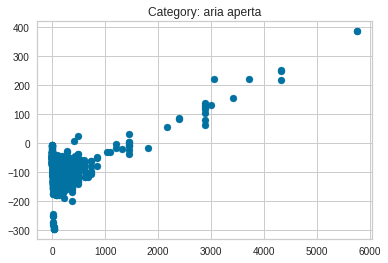

Data dimension: (964, 9447)


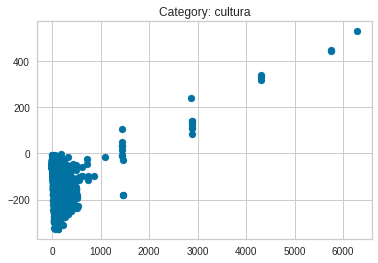

Data dimension: (12, 577)


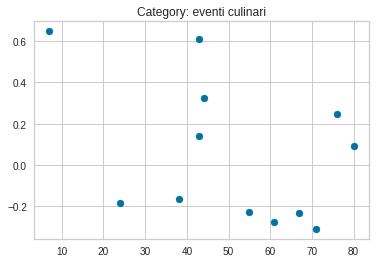

Data dimension: (1269, 8990)


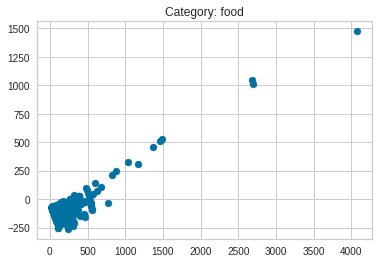

Data dimension: (27, 613)


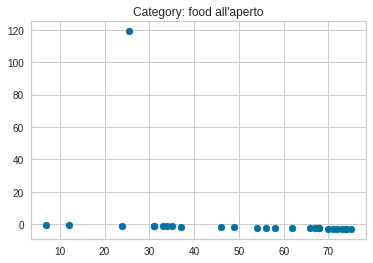

Data dimension: (317, 4285)


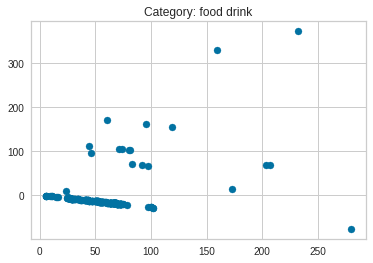

Data dimension: (346, 4573)


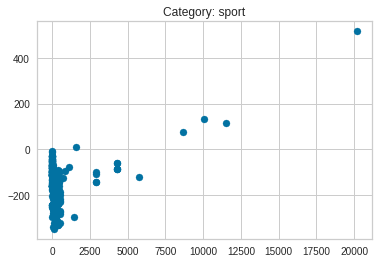

Data dimension: (502, 5278)


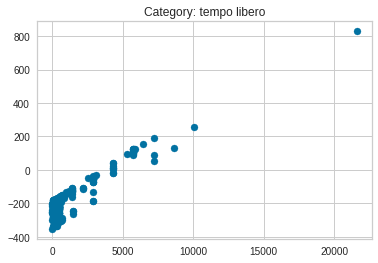

Data dimension: (3, 262)


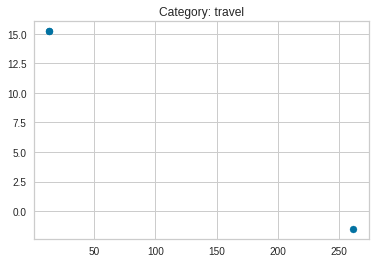

Data dimension: (1324, 13364)


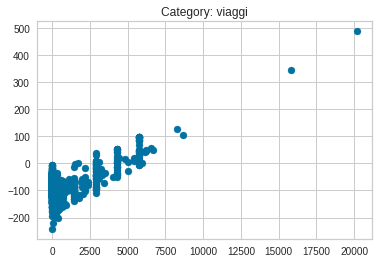

In [ ]:
svd_dict_tfidf = plot_with_SVD_cat(X, categories, tfidf_dict)

Data dimension: (954, 770)


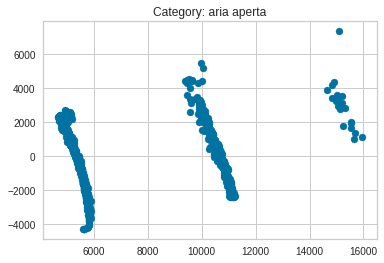

Data dimension: (964, 770)


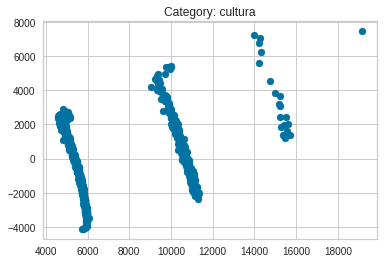

Data dimension: (12, 770)


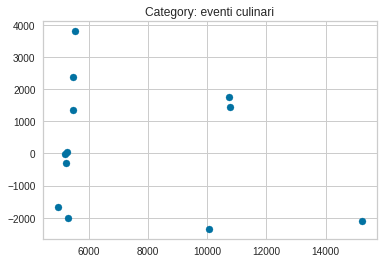

Data dimension: (1269, 770)


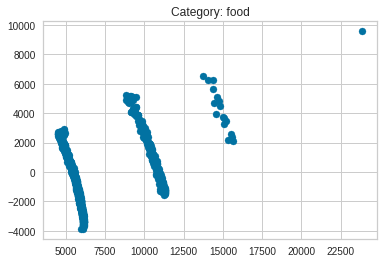

Data dimension: (27, 770)


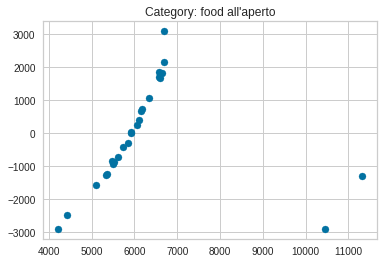

Data dimension: (317, 770)


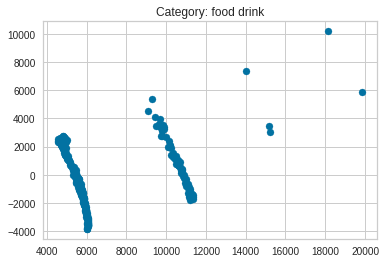

Data dimension: (346, 770)


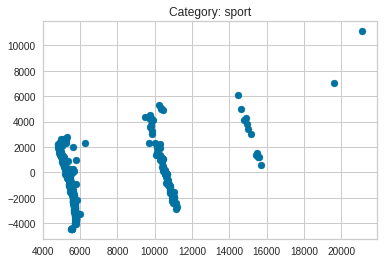

Data dimension: (502, 770)


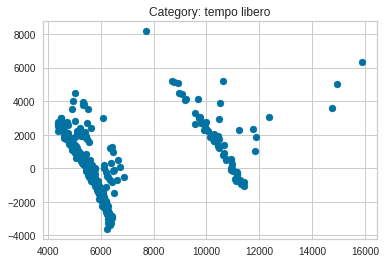

Data dimension: (3, 770)


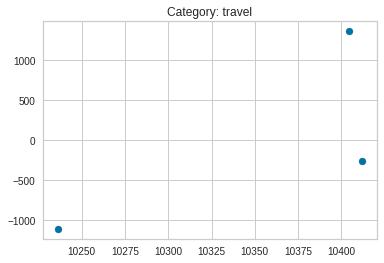

Data dimension: (1324, 770)


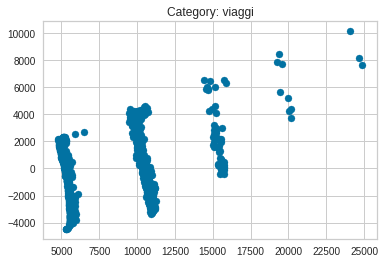

In [ ]:
svd_dict_embeddings = plot_with_SVD_cat(X, categories, embeddings)

In [ ]:
#Plot results
def plotKMeans(label:np.ndarray, df:pd.DataFrame, category:str):
  u_labels = np.unique(label)
  for i in u_labels:
      plt.scatter(df[label == i , 0] , df[label == i , 1] , label = i)
  plt.title('K-means with {} clusters for {}'.format(len(u_labels), category))
  plt.legend()
  plt.show()

In [ ]:
def kmeans_tests(data:pd.DataFrame, category:str, svd_dict:dict, clusters_number:int=10, steps:int=1):
  inertia = []
  times = dict() #{k:time_needed}
  K = range(2,clusters_number,steps) 
  for k in K:
      #Fit 
      start = time.time()
      kmeanModel = KMeans(n_clusters=k)
      kmeans = kmeanModel.fit(data)
      time_needed = time.time() - start
      times[k] = time_needed
      #Elbow
      inertia.append(kmeanModel.inertia_)
      #Clusters
      label = kmeans.predict(data)
      plotKMeans(label, svd_dict[category], category)
  return inertia, times, K

In [ ]:
def elbow_and_statistics(inertia:list, times:dict, K:list):
  #Elbow
  plt.figure(figsize=(10,3))
  plt.plot(K, inertia, 'bx-')
  plt.xlabel('k')
  plt.ylabel('Inertia')
  plt.title('The Elbow Method showing the optimal k')
  plt.show()
  print("\n")
  #Inertia
  for k,value in zip(K, inertia):
    print("Inertia for {} clusters is: {}".format(k,value))
  print("\n")
  #Times needed
  for k,v in times.items():
    print("Time needed to fit kmeans with {} clusters is: {}".format(k,v))

In [ ]:
def elbow_visualizer(data:pd.DataFrame, k:int):
  model = KMeans()
  visualizer = KElbowVisualizer(model, k=k)
  visualizer.fit(data)        
  visualizer.show() 

In [ ]:
def kmeans_computation(data:pd.DataFrame, description_dict:dict, categories:list, svd:dict, k:int, visualizer:bool=False):
  assert type(categories)==list, "Expected list as input not {}".format(type(categories))
  for c in categories:
    print("Category: {}".format(c))
    data_category = data[data[c]!=0]
    descriptions_encodings = pd.DataFrame(description_dict[c], index=data_category.index)
    data_category.drop(columns=categories, inplace=True)
    data_with_encodings = pd.concat([data_category, descriptions_encodings], axis=1, ignore_index=True)
    if visualizer:
      #kmeans
      inertia, times, K = kmeans_tests(data_with_encodings, c, svd, k)
      # Elbow and inertia
      elbow_and_statistics(inertia, times, K)
    else:
      elbow_visualizer(data_with_encodings, k)  

Category: aria aperta


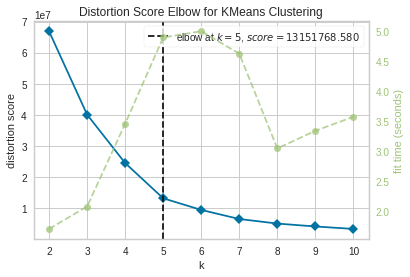

Category: cultura


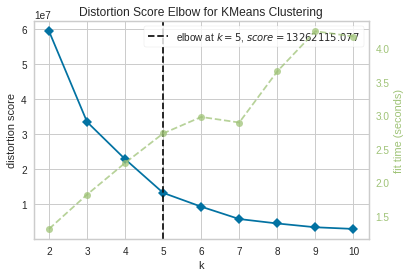

Category: eventi culinari


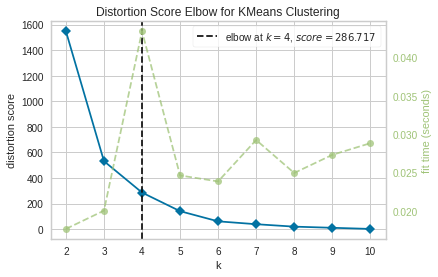

Category: food


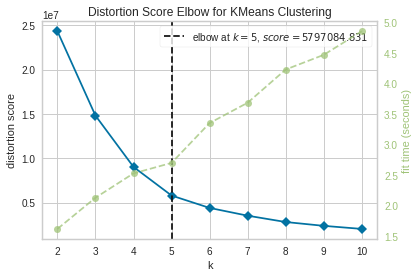

Category: food all'aperto


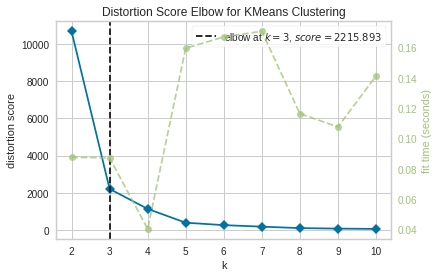

Category: food drink


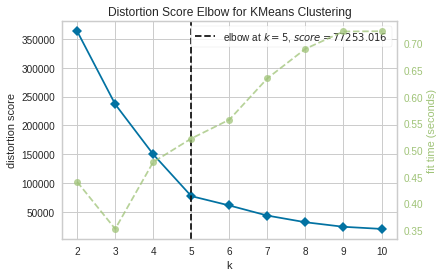

Category: sport


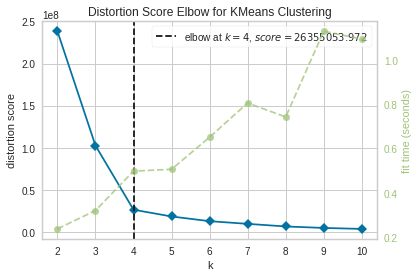

Category: tempo libero


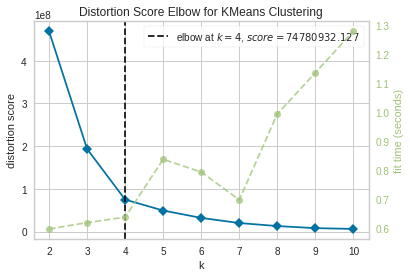

Category: travel


ValueError: ignored

In [ ]:
kmeans_computation(X, tfidf_dict, categories, svd_dict_tfidf, 10)

In [ ]:
kmeans_computation(X, embeddings, categories, svd_dict_embeddings, 10)

## Whole Dataset

In [ ]:
data_type = "tfidf" # "tfidf" "emb" "declutr"

In [ ]:
#Plot data using SVD
def plot_with_SVD(data:pd.DataFrame):
  if type(data)==type([]):
    print("Data dimension: {}".format((len(data),len(data[0]))))
  else:
    print("Data dimension: {}".format(data.shape))
  svd = TruncatedSVD(n_components=2, n_iter=7, random_state=42)
  svd = svd.fit_transform(data)
  plt.scatter(svd[:,0], svd[:,1])
  plt.show()
  return svd

Data dimension: (5724, 6307)


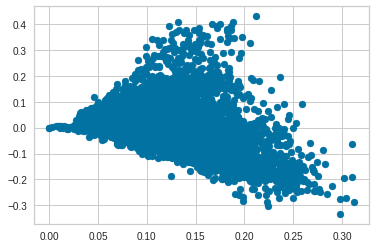

In [ ]:
if data_type == "tfidf":
  svd_tfidf = plot_with_SVD(df_tfidf)
  representation_used = df_tfidf
elif data_type == "emb":
  svd_embeddings = plot_with_SVD(embeddings_np)
  representation_used = np.array(embeddings_np)
else:
  declutr_svd = plot_with_SVD(declutr_emb)
  representation_used = declutr_emb

In [ ]:
#Plot results
def plotKMeans(label:np.ndarray, df:pd.DataFrame):
  u_labels = np.unique(label)
  for i in u_labels:
      plt.scatter(df[label == i , 0] , df[label == i , 1] , label = i)
  plt.title('K-means with {} clusters'.format(len(u_labels)))
  plt.legend()
  plt.show()

In [ ]:
def kmeans_tests(data:pd.DataFrame, svd_tfidf:dict, clusters_number:int=10, steps:int=1):
  inertia = []
  times = dict() #{k:time_needed}
  K = range(2, clusters_number, steps) 
  for k in K:
      #Fit 
      start = time.time()
      kmeanModel = KMeans(n_clusters=k).fit(data)
      time_needed = time.time() - start
      times[k] = time_needed
      #Elbow
      inertia.append(kmeanModel.inertia_)
      #Clusters
      labels = kmeanModel.labels_
      plotKMeans(labels, svd_tfidf)
  return kmeanModel, inertia, times, K, labels

In [ ]:
def elbow_and_statistics(inertia:list, times:dict, K:list):
  #Elbow
  plt.figure(figsize=(10,3))
  plt.plot(K, inertia, 'bx-')
  plt.xlabel('k')
  plt.ylabel('Inertia')
  plt.title('The Elbow Method showing the optimal k')
  plt.show()
  print("\n")
  #Inertia
  for k,value in zip(K, inertia):
    print("Inertia for {} clusters is: {}".format(k,value))
  print("\n")
  #Times needed
  for k,v in times.items():
    print("Time needed to fit kmeans with {} clusters is: {}".format(k,v))

In [ ]:
def elbow_visualizer(data:pd.DataFrame, k:int):
  model = KMeans()
  visualizer = KElbowVisualizer(model, k=k)
  visualizer.fit(data)        
  visualizer.show() 
  elbow_value = visualizer.elbow_value_
  print("The optimal value for the elbow is {}".format(elbow_value))
  return elbow_value

In [ ]:
def kmeans_computation(data:pd.DataFrame, svd, k:int, visualizer:bool=False):
  if visualizer:
    #kmeans
    res_model, inertia, times, K, labels = kmeans_tests(data, svd, k)
    # Elbow and inertia
    elbow_and_statistics(inertia, times, K)
  else:
    k_opt = elbow_visualizer(data, k) 
    res_model = KMeans(n_clusters=k_opt).fit(data) 
  return res_model, res_model.labels_

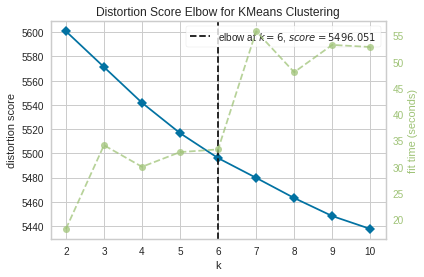

The optimal value for the elbow is 6


In [ ]:
if data_type == "tfidf":
  model_results, labels = kmeans_computation(df_tfidf, svd_tfidf, 10)
elif data_type == "emb":
  model_results, labels = kmeans_computation(np.array(embeddings_np), svd_embeddings, 10)
else:
  model_results, labels = kmeans_computation(declutr_emb, declutr_svd, 10)

## Results

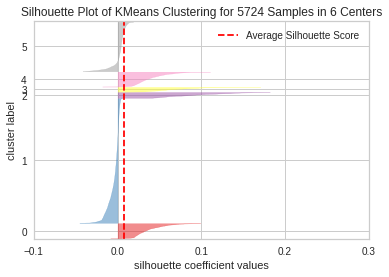

In [ ]:
silhouette_visualizer(model_results, representation_used)

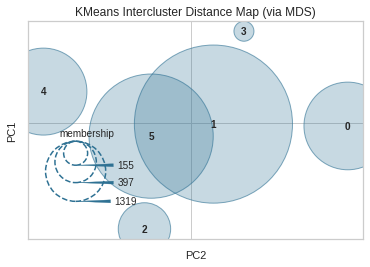

In [ ]:
inter_cluster_distance(model_results, representation_used)

In [ ]:
complete_diameter_dict, avg_diameter_dict, centroid_diameter_dict = intra_cluster_distance(labels, representation_used)

Intra cluster distances for topic 1:
Complete Diameter Distance: 5723.0
Average Diameter Distance: 2003.1791788654166
Centroid Diameter Distance: 466697.8497676133
----------------------------------------------------------------------------------------------------
Intra cluster distances for topic 4:
Complete Diameter Distance: 5701.0
Average Diameter Distance: 2348.706714500165
Centroid Diameter Distance: 423457.69415177265
----------------------------------------------------------------------------------------------------
Intra cluster distances for topic 5:
Complete Diameter Distance: 5653.0
Average Diameter Distance: 1576.2682769974494
Centroid Diameter Distance: 446458.07626530237
----------------------------------------------------------------------------------------------------
Intra cluster distances for topic 0:
Complete Diameter Distance: 5673.0
Average Diameter Distance: 1641.9469318250926
Centroid Diameter Distance: 474459.410837917
-----------------------------------------

In [ ]:
calinski_harabasz(representation_used, labels)

Calinski-Harabasz score (higher is better): 28.01408712024473


In [ ]:
davies_bouldin(representation_used, labels)

Davies-Bouldin score (closer to 0 is better): 7.79782431538667


In [ ]:
topic_diversity(labels, data)

{0: 0.0, 1: 0.0, 2: 1.0, 3: 0.0, 4: 0.0, 5: 0.0}

In [ ]:
c_npmi, c_uci, c_umass = coherence(labels, data)

c_npmi: 0.07563182512482426
c_uci: 0.02112084317563327
c_umass: -2.6025346764498716
----------------------------------------------------------------------------------------------------
c_npmi for each topic: [0.06206953833360454, 0.15878865005204226, 0.20729688092564547, 0.029307363726885166, -0.011141756539115501, 0.00747027424988356]
c_uci for each topic: [0.06206953833360454, 0.15878865005204226, 0.20729688092564547, 0.029307363726885166, -0.011141756539115501, 0.00747027424988356]
c_umass for each topic: [0.06206953833360454, 0.15878865005204226, 0.20729688092564547, 0.029307363726885166, -0.011141756539115501, 0.00747027424988356]


#DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from collections import Counter

In [ ]:
def plot_dbscan(data:pd.DataFrame, labels:np.ndarray, core_samples_mask:np.ndarray, n_clusters_:int):  
  unique_labels = set(labels)
  colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
  for k, col in zip(unique_labels, colors):
      if k == -1:
          # Black used for noise.
          col = [0, 0, 0, 1]

      if(type(data)==type(np.zeros(1))):
        data_array = data
      else:
        data_array = data.to_numpy()
      class_member_mask = labels == k
      xy = data_array[class_member_mask & core_samples_mask]
      plt.plot(
          xy[:, 0],
          xy[:, 1],
          "o",
          markerfacecolor=tuple(col),
          markeredgecolor="k",
          markersize=14,
      )

      xy = data_array[class_member_mask & ~core_samples_mask]
      plt.plot(
          xy[:, 0],
          xy[:, 1],
          "o",
          markerfacecolor=tuple(col),
          markeredgecolor="k",
          markersize=6,
      )

  plt.title("Estimated number of clusters: %d" % n_clusters_)
  plt.show()

## Categories

In [ ]:
def compute_DBSCAN_categories(data:pd.DataFrame, categories:list, description_dict:dict, plot:bool=False):
  dbscan_dict = dict()
  for c in categories:
    data_category = data[data[c]!=0]
    descriptions_encodings = pd.DataFrame(description_dict[c], index=data_category.index)
    data_category.drop(columns=categories, inplace=True)
    data_with_encodings = pd.concat([data_category, descriptions_encodings], axis=1, ignore_index=True)
    clustering = DBSCAN(eps=10, min_samples=10).fit(data_with_encodings)
    dbscan_dict[c] = clustering
    labels = clustering.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    counter = Counter(labels)
    counter = dict(sorted(counter.items(), key=lambda item: item[1], reverse=True))
    print("Category '{}' has {} clusters and {} noisy points\nDistribution of the samples in the clusters: {}\n".format(c, n_clusters_, n_noise_, counter))
    if plot:
      core_samples_mask = np.zeros_like(labels, dtype=bool)
      core_samples_mask[clustering.core_sample_indices_] = True
      plot_dbscan(data_with_encodings, labels, core_samples_mask, n_clusters_)
  return dbscan_dict

Category 'aria aperta' has 9 clusters and 259 noisy points
Distribution of the samples in the clusters: {0: 416, -1: 259, 1: 71, 3: 55, 5: 43, 4: 38, 6: 19, 2: 18, 8: 18, 7: 17}



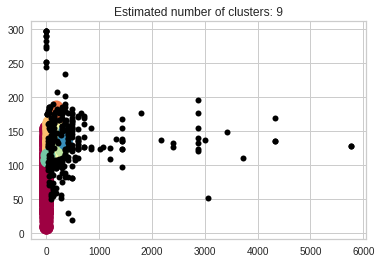

Category 'cultura' has 7 clusters and 355 noisy points
Distribution of the samples in the clusters: {-1: 355, 0: 349, 2: 130, 3: 52, 1: 32, 4: 17, 6: 15, 5: 14}



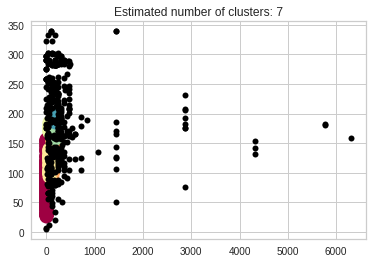

Category 'eventi culinari' has 0 clusters and 12 noisy points
Distribution of the samples in the clusters: {-1: 12}



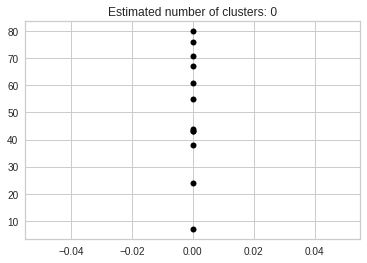

Category 'food' has 9 clusters and 235 noisy points
Distribution of the samples in the clusters: {0: 491, 1: 290, -1: 235, 3: 139, 2: 36, 4: 25, 8: 19, 5: 13, 6: 11, 7: 10}



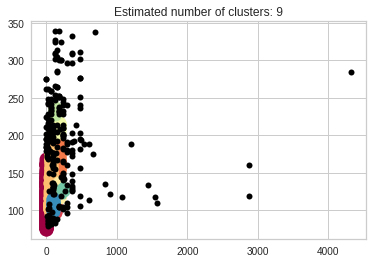

Category 'food all'aperto' has 1 clusters and 12 noisy points
Distribution of the samples in the clusters: {0: 15, -1: 12}



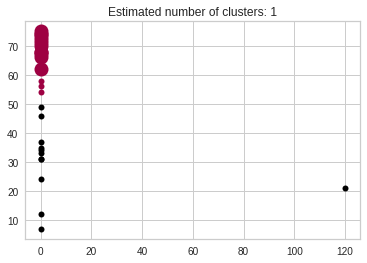

Category 'food drink' has 1 clusters and 26 noisy points
Distribution of the samples in the clusters: {0: 291, -1: 26}



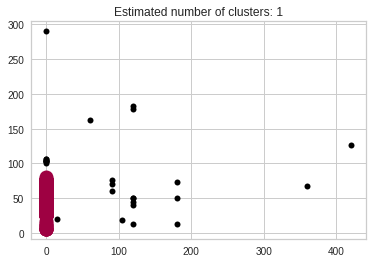

Category 'sport' has 5 clusters and 235 noisy points
Distribution of the samples in the clusters: {-1: 235, 3: 51, 4: 20, 1: 14, 2: 14, 0: 12}



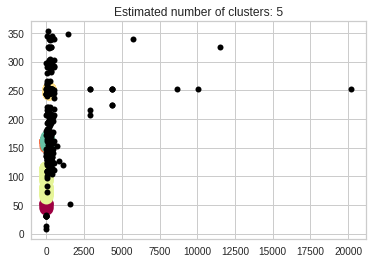

Category 'tempo libero' has 10 clusters and 320 noisy points
Distribution of the samples in the clusters: {-1: 320, 0: 29, 5: 25, 3: 24, 7: 19, 4: 17, 6: 17, 1: 15, 2: 13, 9: 13, 8: 10}



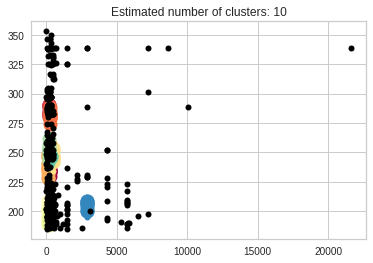

Category 'travel' has 0 clusters and 3 noisy points
Distribution of the samples in the clusters: {-1: 3}



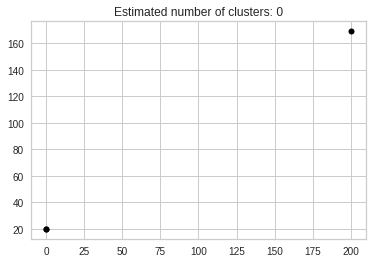

Category 'viaggi' has 13 clusters and 322 noisy points
Distribution of the samples in the clusters: {0: 714, -1: 322, 5: 49, 4: 47, 3: 36, 1: 32, 2: 27, 7: 21, 6: 20, 9: 13, 12: 12, 10: 11, 11: 10, 8: 10}



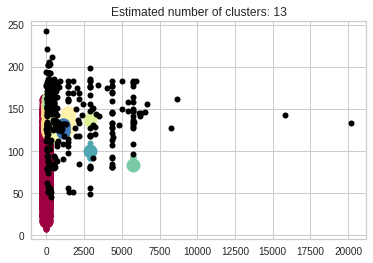

In [ ]:
dbscan_tfidf = compute_DBSCAN_categories(X, categories, tfidf_dict, plot=True)

In [ ]:
dbscan_embeddings = compute_DBSCAN_categories(X, categories, embeddings_dict, plot=True)

## Whole Dataset

In [ ]:
def compute_DBSCAN(data:pd.DataFrame, encodings:list, eps:float, min_samples:int, p:int=2, plot:bool=False):
  clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(encodings)
  labels = clustering.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_noise_ = list(labels).count(-1)
  counter = Counter(labels)
  counter = dict(sorted(counter.items(), key=lambda item: item[1], reverse=True))
  print("The dataset has {} clusters and {} noisy points\nDistribution of the samples in the clusters: {}\n".format(n_clusters_, n_noise_, counter))
  if plot:
    core_samples_mask = np.zeros_like(labels, dtype=bool)
    core_samples_mask[clustering.core_sample_indices_] = True
    plot_dbscan(encodings, labels, core_samples_mask, n_clusters_)
  return clustering

The dataset has 0 clusters and 5724 noisy points
Distribution of the samples in the clusters: {-1: 5724}



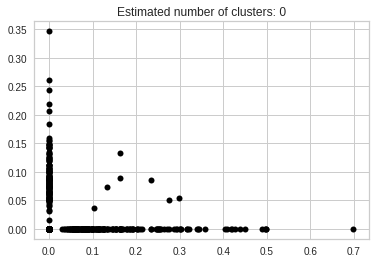

In [ ]:
dbscan_categories = compute_DBSCAN(X, df_tfidf, eps=0.5, min_samples=10, plot=True)

The dataset has 3 clusters and 5711 noisy points
Distribution of the samples in the clusters: {-1: 5711, 1: 7, 0: 3, 2: 3}



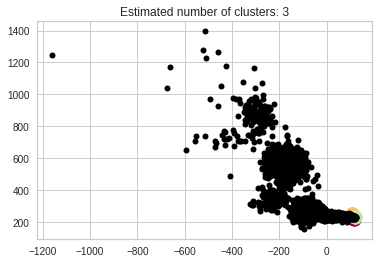

In [ ]:
dbscan_categories = compute_DBSCAN(X, np.array(embeddings_np), eps=0.001, min_samples=3, plot=True)

In [ ]:
dbscan_categories = compute_DBSCAN(X, declutr_emb, eps=0.5, min_samples=10, plot=True)

# GMM

In [ ]:
from sklearn.mixture import GaussianMixture

In [ ]:
def plot_GMM(gmm, data:pd.DataFrame):
  if(type(data)==type(np.zeros(1))):
    data_array = data
  else:
    data_array = data.to_numpy()
  gmm_labels = gmm.predict(data_array)
  plt.scatter(data_array[:,0], data_array[:,1], c=gmm_labels, cmap='rainbow')
  plt.axis('equal')
  plt.show()

## Categories

In [ ]:
def GMM_categories(data:pd.DataFrame, categories:list, description_dict:dict, plot:bool=False):
  gmm_dict = dict()
  for c in categories:
    data_category = data[data[c]!=0]
    descriptions_encodings = pd.DataFrame(description_dict[c], index=data_category.index)
    data_category.drop(columns=categories, inplace=True)
    data_with_encodings = pd.concat([data_category, descriptions_encodings], axis=1, ignore_index=True)
    gmm = GaussianMixture(n_components=5, random_state=42).fit(data_with_encodings)
    gmm_dict[c] = gmm
    print("Plot of clusters for class {}".format(c))
    plot_GMM(gmm, data_with_encodings)
    #plot_results(data_with_tfidf, gmm.predict(data_with_tfidf), gmm.means_, gmm.covariances_, 0, "Class {}".format(c))
  return gmm_dict

Plot of clusters for class aria aperta


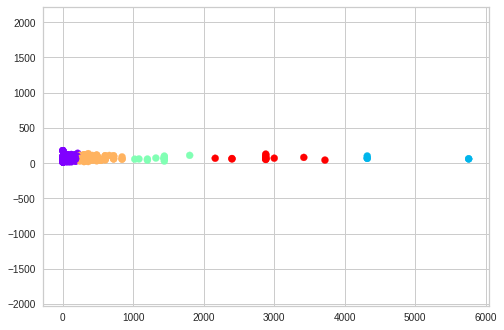

Plot of clusters for class cultura


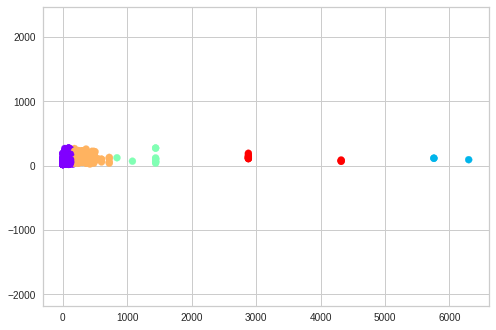

Plot of clusters for class food


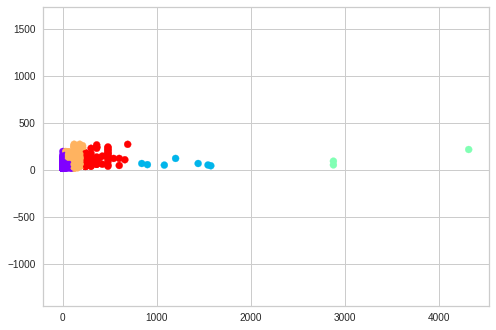

Plot of clusters for class sport


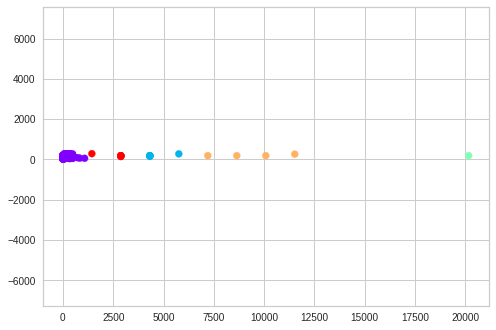

Plot of clusters for class tempo libero


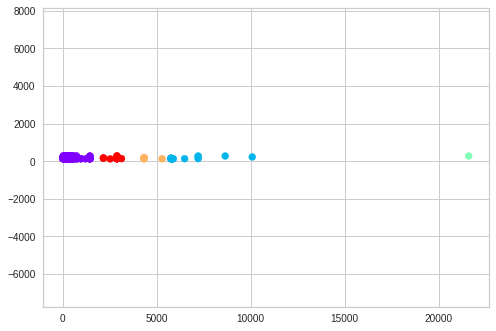

Plot of clusters for class viaggi


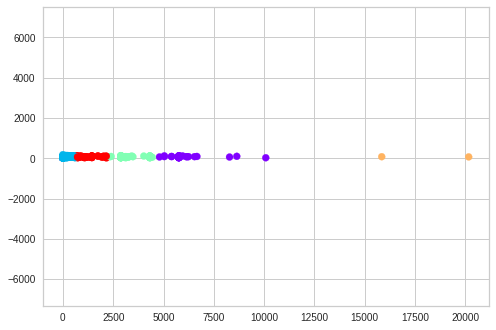

{'aria aperta': GaussianMixture(n_components=5, random_state=42),
 'cultura': GaussianMixture(n_components=5, random_state=42),
 'food': GaussianMixture(n_components=5, random_state=42),
 'sport': GaussianMixture(n_components=5, random_state=42),
 'tempo libero': GaussianMixture(n_components=5, random_state=42),
 'viaggi': GaussianMixture(n_components=5, random_state=42)}

In [ ]:
GMM_categories(X, categories, tfidf_dict, plot=True)

Plot of clusters for class aria aperta


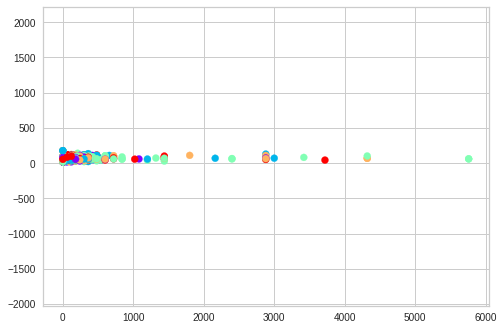

Plot of clusters for class cultura


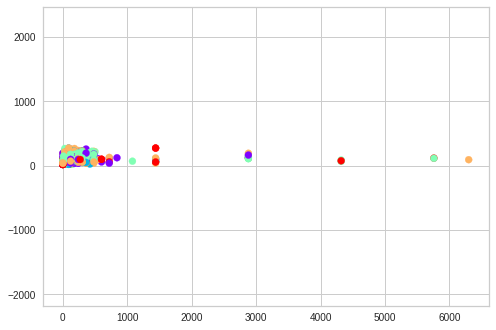

Plot of clusters for class food


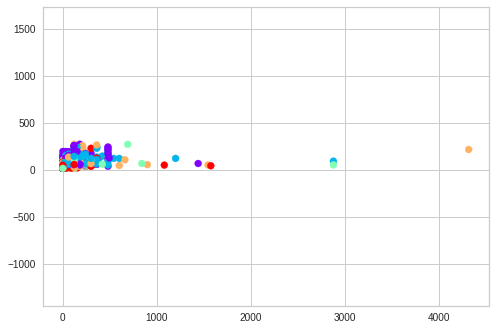

Plot of clusters for class sport


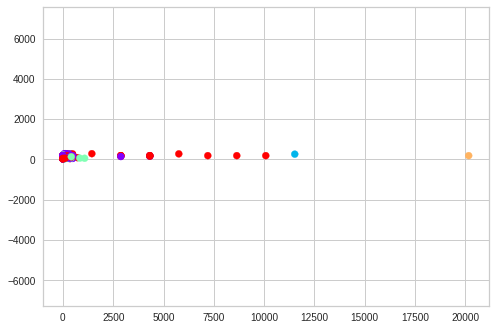

Plot of clusters for class tempo libero


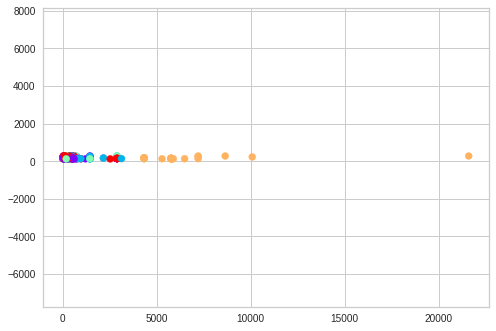

Plot of clusters for class viaggi


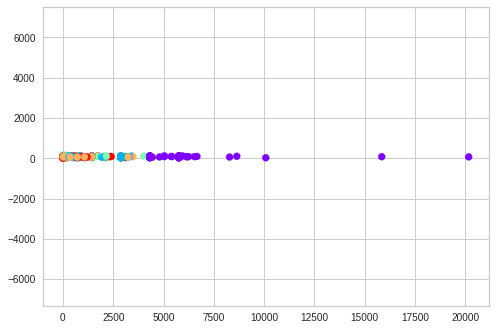

{'aria aperta': GaussianMixture(n_components=5, random_state=42),
 'cultura': GaussianMixture(n_components=5, random_state=42),
 'food': GaussianMixture(n_components=5, random_state=42),
 'sport': GaussianMixture(n_components=5, random_state=42),
 'tempo libero': GaussianMixture(n_components=5, random_state=42),
 'viaggi': GaussianMixture(n_components=5, random_state=42)}

In [ ]:
GMM_categories(X, categories, embeddings, plot=True)

## Whole Dataset

In [ ]:
def GMM_dataset(data_encoded:list, plot:bool=False):
  gmm = GaussianMixture(n_components=5, random_state=42).fit(data_encoded)
  plot_GMM(gmm, data_encoded)
  labels_gmm = gmm.predict(data_encoded)
  return gmm, labels_gmm

In [ ]:
def gmm_print_predictions(labels_gmm):
  predictions = np.unique(labels_gmm, return_counts=True)
  clusters = predictions[0]
  freq = predictions[1]
  for t in zip(clusters,freq):
  print("Cluster {} has {} points".format(t[0], t[1]))

Cluster 0 has 2117 points
Cluster 1 has 1793 points
Cluster 2 has 615 points
Cluster 3 has 1050 points
Cluster 4 has 149 points


In [ ]:
gmm_tfidf, labels_gmm_tfidf = GMM_dataset(df_tfidf, plot=True)

In [ ]:
gmm_print_predictions(labels_gmm_tfidf)

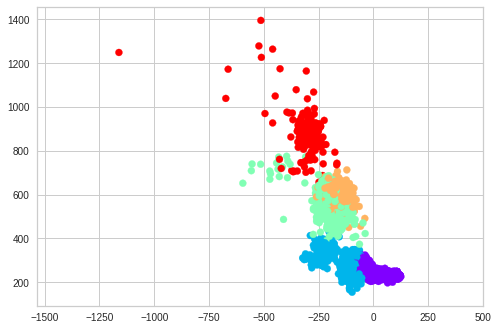

In [ ]:
gmm_embeddings, labels_gmm_emb = GMM_dataset(np.array(embeddings_np), plot=True)

In [ ]:
gmm_print_predictions(labels_gmm_emb)

In [ ]:
gmm_declutr_emb, labels_gmm_declutr = GMM_dataset(declutr_emb, plot=True)

In [ ]:
gmm_print_predictions(labels_gmm_emb)

# UMAP + HDBSCAN

In [ ]:
!pip install hdbscan
!pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.2 MB 7.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2342096 sha256=3fbc58ff4e4a975bfd0198979837bc7a38a94cb5b27e7188aa4e7851e0604095
  Stored in directory: /root/.cache/pip/wheels/6e/7a/5e/259ccc841c085fc41b99ef4a71e896b62f5161f2bc8a14c97a
Successfully built hdbscan
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 4.5 MB/s 
     |████████████████████████████████| 1.1 MB 15.1 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=0a851d68969bf4323a7b7f2327d71f3840013dae6598650459cbb565035669bd
  Stored in directory: /root/.cache/pip/wheels/

In [ ]:
import hdbscan
import umap.umap_ as umap

In [ ]:
def plot_clusters(embeddings, clusters, n_neighbors:int=15, min_dist:float=0.1):
    """
    Reduce dimensionality of best clusters and plot in 2D

    Arguments:
        embeddings: embeddings to use
        clusteres: HDBSCAN object of clusters
        n_neighbors: float, UMAP hyperparameter n_neighbors
        min_dist: float, UMAP hyperparameter min_dist for effective
                  minimum distance between embedded points

    """
    umap_data = umap.UMAP(n_neighbors=n_neighbors, 
                          n_components=2, 
                          min_dist = min_dist,  
                          #metric='cosine',
                          random_state=42).fit_transform(embeddings)

    point_size = 100.0 / np.sqrt(embeddings.shape[0])
    
    result = pd.DataFrame(umap_data, columns=['x', 'y'])
    result['labels'] = clusters.labels_

    fig, ax = plt.subplots(figsize=(14, 8))
    outliers = result[result.labels == -1]
    clustered = result[result.labels != -1]
    plt.scatter(outliers.x, outliers.y, color = 'lightgrey', s=point_size)
    plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=point_size, cmap='jet')
    plt.colorbar()
    plt.show()

In [ ]:
def score_clusters(clusters, prob_threshold:float = 0.05):
    """
    Returns the label count and cost of a given clustering

    Arguments:
        clusters: HDBSCAN clustering object
        prob_threshold: float, probability threshold to use for deciding
                        what cluster labels are considered low confidence

    Returns:
        label_count: int, number of unique cluster labels, including noise
        cost: float, fraction of data points whose cluster assignment has
              a probability below cutoff threshold
    """
    
    cluster_labels = clusters.labels_
    label_count = len(np.unique(cluster_labels))
    total_num = len(clusters.labels_)
    cost = (np.count_nonzero(clusters.probabilities_ < prob_threshold)/total_num)
    
    return label_count, cost

In [ ]:
def generate_clusters(message_embeddings,
                      n_neighbors:int,
                      n_components:int, 
                      min_cluster_size:int,
                      min_dist:float,
                      min_samples:int = None,
                      random_state:int = None):
    """
    Returns HDBSCAN objects after first performing dimensionality reduction using UMAP
    
    Arguments:
        message_embeddings: embeddings to use
        n_neighbors: int, UMAP hyperparameter n_neighbors
        n_components: int, UMAP hyperparameter n_components
        min_cluster_size: int, HDBSCAN hyperparameter min_cluster_size
        min_samples: int, HDBSCAN hyperparameter min_samples
        random_state: int, random seed
        
    Returns:
        clusters: HDBSCAN object of clusters
    """
    
    umap_embeddings = (umap.UMAP(n_neighbors = n_neighbors, 
                                n_components = n_components, 
                                #metric = 'cosine', 
                                min_dist = min_dist,
                                random_state=random_state)
                            .fit_transform(message_embeddings))

    clusters = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, 
                               min_samples = min_samples,
                               #metric='euclidean', 
                               gen_min_span_tree=True,
                               cluster_selection_method='eom').fit(umap_embeddings)
    return clusters

## Categories

In [ ]:
def compute_hdbscan_dict(embeddings:dict, 
                         categories:list, 
                         n_neighbors:int = 100, 
                         n_components:int = 2, 
                         min_cluster_size:int = 100,
                         min_dist:float = 0.5): 

  hdbscan_clusters = dict()
  for c in categories:
    print("Clustering category '{}'".format(c))
    try:
      if type(embeddings[c]) == list:
        embeddings_cpu = torch.Tensor(len(embeddings[c]), len(embeddings[c][0]))
        list_emb = [t.unsqueeze(0) for t in embeddings[c]] 
        #print(embeddings_cpu.shape, list_emb[0].shape)
        embeddings_cpu = torch.cat(list_emb, dim=0)
        encodings = embeddings_cpu.cpu()
        #print(embeddings_cpu.device)
      else:
        encodings = embeddings[c]
      hdbscan_clusters[c] = generate_clusters(encodings,
                                              n_neighbors = n_neighbors, 
                                              n_components = n_components, 
                                              min_cluster_size = min_cluster_size,
                                              min_dist = min_dist,
                                              random_state=42)
      labels_def, cost_def = score_clusters(hdbscan_clusters[c])
      print("Number of labels: {}".format(labels_def))
      print("Cost: {}".format(cost_def))
      plot_clusters(encodings,
                    hdbscan_clusters[c],
                    n_neighbors = n_neighbors,
                    min_dist = min_dist)
    except Exception as e:
      print("---> Cannot cluster category '{}' because of error:\n{}".format(c, e))
      #continue
    print()
  return hdbscan_clusters

Clustering category 'aria aperta'
Number of labels: 2
Cost: 0.0


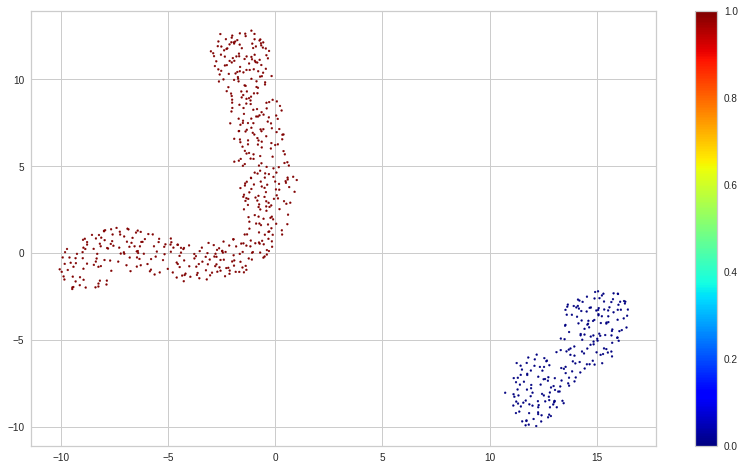


Clustering category 'cultura'
Number of labels: 2
Cost: 0.0


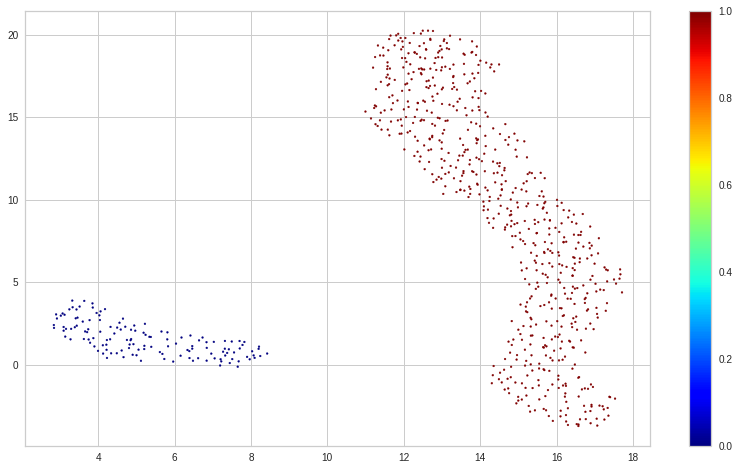


Clustering category 'food'
Number of labels: 2
Cost: 0.0


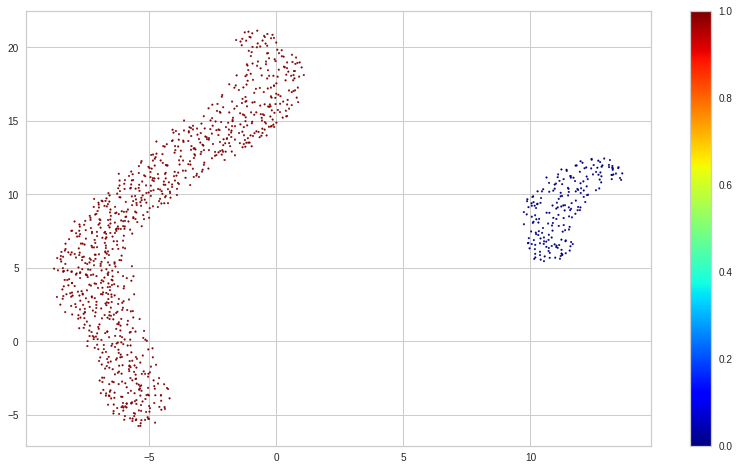


Clustering category 'sport'
Number of labels: 2
Cost: 0.0


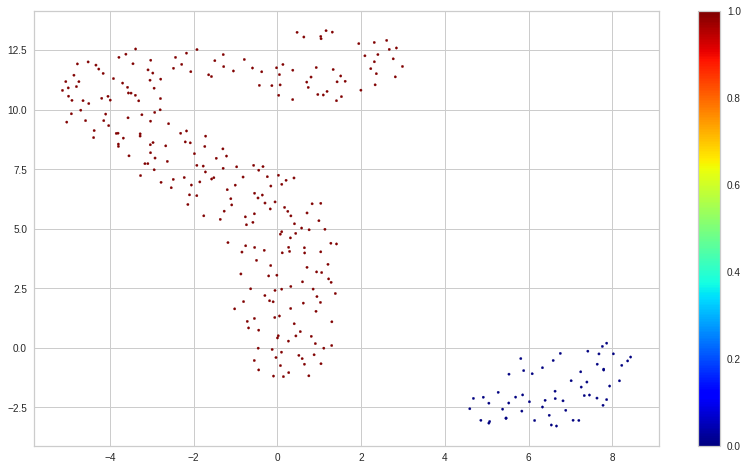


Clustering category 'tempo libero'
Number of labels: 2
Cost: 0.0


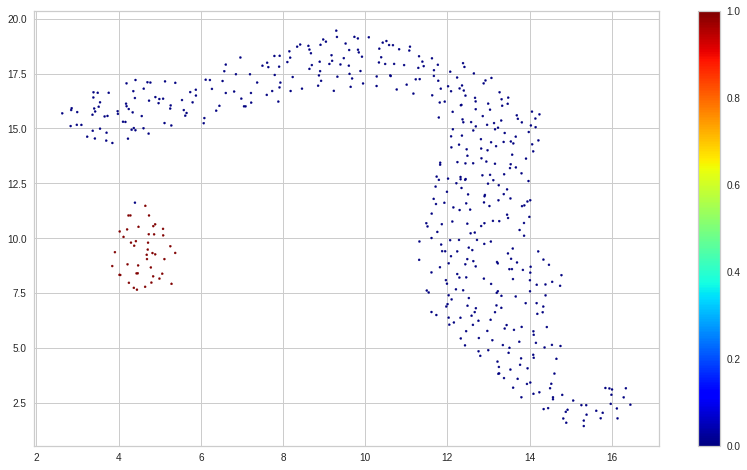


Clustering category 'viaggi'
Number of labels: 2
Cost: 0.0


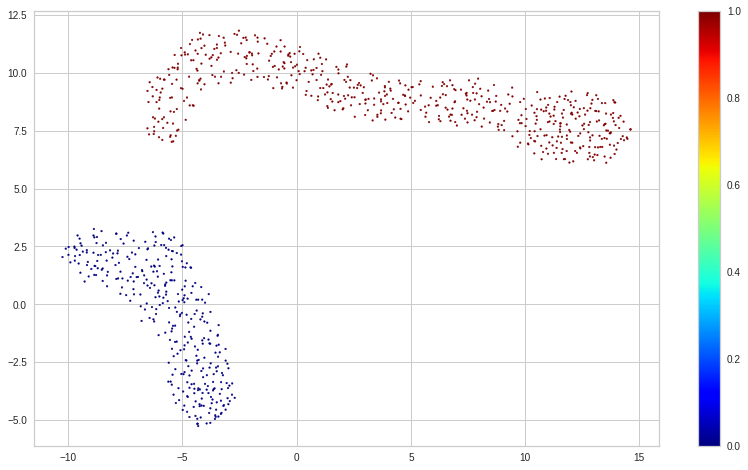

In [ ]:
hdbscan_dict = compute_hdbscan_dict(embeddings, 
                                    categories,
                                    n_neighbors = 200, 
                                    n_components = 2, 
                                    min_cluster_size = 30,
                                    min_dist=0.9)

Clustering category 'aria aperta'
Number of labels: 3
Cost: 0.2506775067750677


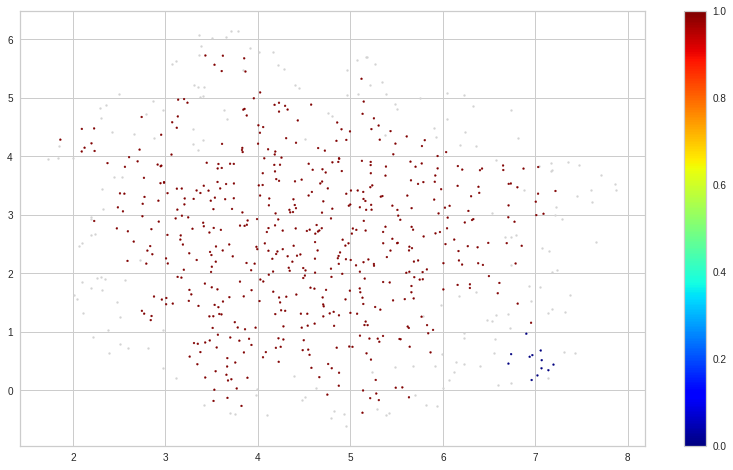


Clustering category 'cultura'
Number of labels: 3
Cost: 0.06060606060606061


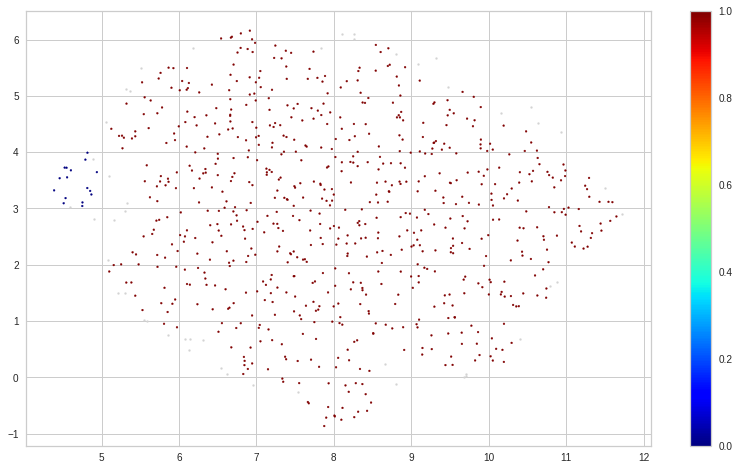


Clustering category 'food'
Number of labels: 2
Cost: 0.0


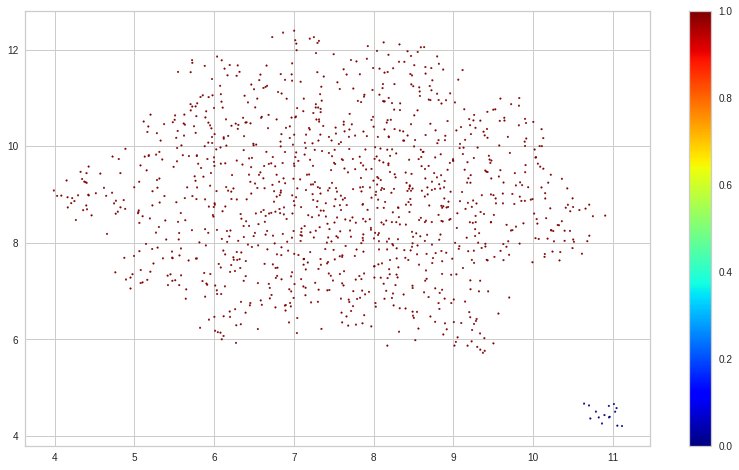


Clustering category 'sport'
Number of labels: 4
Cost: 0.8190184049079755


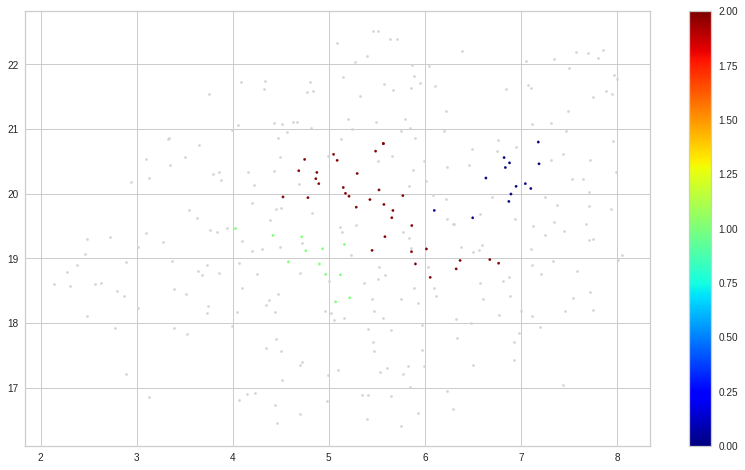


Clustering category 'tempo libero'
Number of labels: 3
Cost: 0.10727969348659004


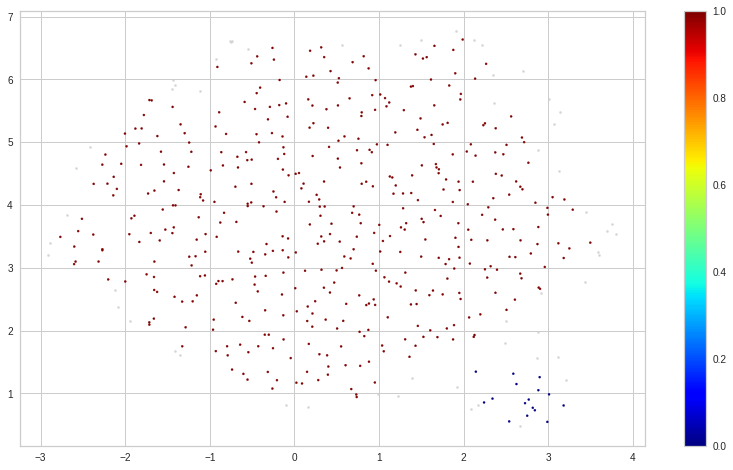


Clustering category 'viaggi'
Number of labels: 3
Cost: 0.14882226980728053


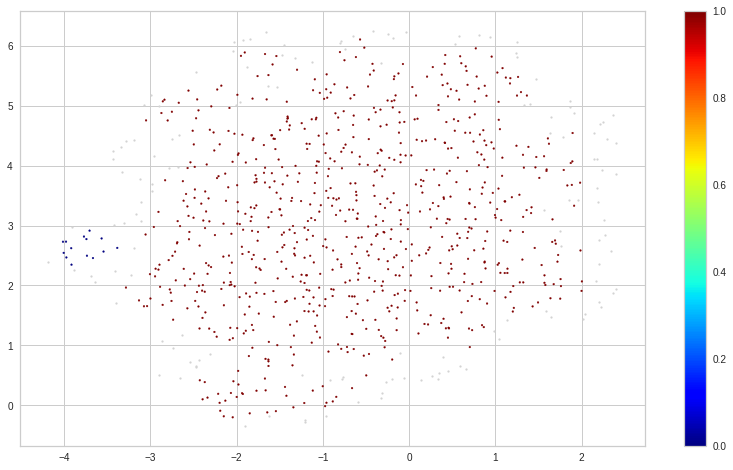

In [ ]:
hdbscan_dict = compute_hdbscan_dict(tfidf_dict,
                                    categories,
                                    n_neighbors = 100, 
                                    n_components = 2, 
                                    min_cluster_size = 10,
                                    min_dist=0.5)

## Whole Dataset

In [ ]:
def compute_hdbscan_dict(embeddings:dict, 
                         n_neighbors:int = 100, 
                         n_components:int = 2, 
                         min_cluster_size:int = 100,
                         min_dist:float = 0.5): 

  try:
    if type(embeddings) != list:
      embeddings_cpu = torch.Tensor(len(embeddings), len(embeddings[0]))
      list_emb = [t.unsqueeze(0) for t in embeddings] 
      #print(embeddings_cpu.shape, list_emb[0].shape)
      embeddings_cpu = torch.cat(list_emb, dim=0)
      encodings = embeddings_cpu.cpu()
      #print(embeddings_cpu.device)
    else:
      encodings = embeddings
    hdbscan_clusters = generate_clusters(encodings,
                                            n_neighbors = n_neighbors, 
                                            n_components = n_components, 
                                            min_cluster_size = min_cluster_size,
                                            min_dist = min_dist,
                                            random_state=42)
    labels_def, cost_def = score_clusters(hdbscan_clusters)
    print("Number of labels: {}".format(labels_def))
    print("Cost: {}".format(cost_def))
    plot_clusters(encodings,
                  hdbscan_clusters,
                  n_neighbors = n_neighbors,
                  min_dist = min_dist)
  except Exception as e:
    print("---> Cannot cluster because of error:\n{}".format(e))
    return None
    #continue
  print()
  return hdbscan_clusters

Number of labels: 5
Cost: 0.002795248078266946


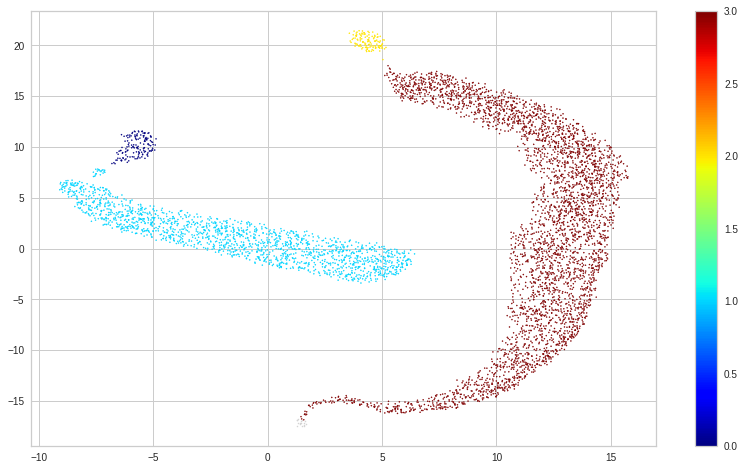

In [ ]:
hdbscan_dict = compute_hdbscan_dict(np.array(embeddings_np),
                                    n_neighbors = 200, 
                                    n_components = 2, 
                                    min_cluster_size = 30,
                                    min_dist=0.9)

Number of labels: 3
Cost: 0.1848357791754018


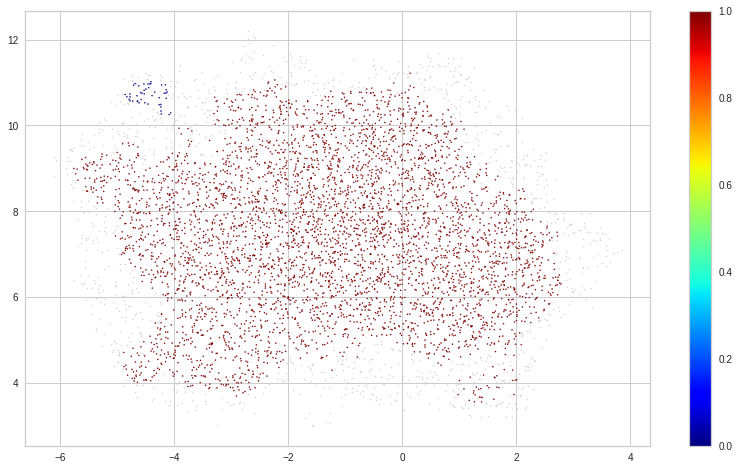

In [ ]:
hdbscan_dict = compute_hdbscan_dict(df_tfidf, 
                                    n_neighbors = 200, 
                                    n_components = 2, 
                                    min_cluster_size = 30,
                                    min_dist=0.9)

In [ ]:
hdbscan_dict = compute_hdbscan_dict(declutr_emb, 
                                    n_neighbors = 200, 
                                    n_components = 2, 
                                    min_cluster_size = 30,
                                    min_dist=0.9)

#WEClustering

The algorithm is described in my notes (/Clustering/WECustering)

#### Phases 1-2: Preprocess, embeddings extraction and filtration

In [ ]:
!pip install emoji

In [ ]:
from math import ceil
from tqdm import tqdm

import nltk
nltk.download('punkt')

from nltk.corpus import stopwords
nltk.download('stopwords')
ita_stopwords = set(nltk.corpus.stopwords.words('italian'))

import emoji
import string
punctuation = string.punctuation.replace("#","")
punctuation += '’“”'

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
device = 0
if torch.cuda.is_available():    
    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")
    print('There are %d GPU(s) available.' % torch.cuda.device_count())
    print('We will use the GPU:', torch.cuda.get_device_name(0))
# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla K80


In [ ]:
class MyTransformer():
    def __init__(
            self,
            pretrained_model_name_or_path: str = "dbmdz/bert-base-italian-cased",
            device: str = 'cpu'
    ):
        super().__init__()
        self.tokenizer = AutoTokenizer.from_pretrained(pretrained_model_name_or_path)
        self.model = AutoModel.from_pretrained(pretrained_model_name_or_path)
        self.model.to(device)
        print("Device used: {}".format(self.model.device))
        self.word_dictionary = dict()
        self.set_w = set()

    def add_special_tokens(self, tokens_ids):
      # add CLS (token_id is 101) and SEP (token_id is 102)
      ids = [101] + tokens_ids + [102]
      # add padding (token_id is 0)
      padding_length = 512-len(ids)
      for i in range(padding_length):
        ids += [0]
      #print("\n padding_length: {} - len(tokens_ids): {}\nTokens_ids: {}".format(padding_length, len(ids), ids))
      return ids

    def compute_embedding(self, tokens_ids):
      self.model.eval()
      with torch.no_grad():
        if(len(tokens_ids) <= 510):
          #tokens_ids = self.add_special_tokens(tokens_ids)
          context_embeddings = self.model(torch.tensor(tokens_ids)[None,:].to(device))[0]
        else:
          k = ceil(len(tokens_ids) / 510.0)
          chunks = np.array_split(tokens_ids, k)
          for i in range(len(chunks)):
            chunks[i] = self.add_special_tokens(chunks[i].tolist())
          chunks_tensor = torch.tensor(chunks[0])[None,:].to(device)
          context_embeddings_list = self.model(chunks_tensor)[0].to(device)
          for i in range(1, len(chunks)):
            chunks_tensor = torch.tensor(chunks[i])[None,:].to(device)
            context_embeddings_list = torch.cat((context_embeddings_list, self.model(chunks_tensor)[0]), 1)
          #dim = context_embeddings_list.shape[-1]
          context_embeddings = context_embeddings_list.to(device)
        #compute the average of the vectors
        #avg_embeddings = torch.sum(context_embeddings,1)[0]
        #print("Embeddings shape: {}".format(context_embeddings.shape))
      return context_embeddings

    def demoji(self, text):
      allchars = [str for str in text] #.decode('utf-8')
      emoji_list = [c for c in allchars if c in emoji.UNICODE_EMOJI]
      clean_text = ' '.join([str for str in text.split() if not any(i in str for i in emoji_list)])
      return clean_text


# I can obtain the embedding of a word by averaging the subwords -> 
# once I have the sentence's embeddings I can transform subwords back to words 
# ## means that the subword has to be attached to the previous one without spaces

    def words_from_subwords(self, emb, tokens:list):
      list_emb = emb.tolist()
      res_tokens = []
      res_emb = []
      for j, t in enumerate(tokens):
        if t[:2] == "##":
          #print(tokens[j-1], tokens[j])
          word = res_tokens[-1] + tokens[j].replace("#", "")
          res_tokens[-1] = word
          emb_mean = [np.mean(k) for k in zip(res_emb[-1], list_emb[0][j])]
          res_emb[-1] = emb_mean
        else:
          res_tokens.append(t)
          res_emb.append(list_emb[0][j])
      return torch.unsqueeze(torch.Tensor(res_emb), 0), res_tokens

    def filter_embeddings(self, emb, tokens:list):
      list_emb = emb.tolist()
      res_tokens = []
      #print(len(list_emb[0]))
      del_count = 0
      for j, t in enumerate(tokens):
        #remove [UNK]
        if t == "[UNK]":
          list_emb[0].pop(j-del_count)
          del_count += 1
        #remove digits
        elif any(ch.isdigit() for ch in t):
          list_emb[0].pop(j-del_count)
          del_count += 1
        #remove punctuation
        elif any(ch in punctuation for ch in t):
          list_emb[0].pop(j-del_count)
          del_count += 1
        #remove stopwords
        elif t.lower() in ita_stopwords: #.replace("#", "")
          list_emb[0].pop(j-del_count)
          del_count += 1
        else:
          res_tokens.append(t)
      return torch.Tensor(list_emb), res_tokens

    def compute_word_dictionary(self, tokens:list, embeddings:list, doc:int):
      for t,e in zip(tokens, embeddings[0]):
        #print("TOKEN: " + t)
        #print("emb shape: {}".format(e.shape))
        if t in self.word_dictionary:
          # add doc -> if a token appears more than once in a document than it will be added multiple times
          self.word_dictionary[t][1].append(doc)
          #print("DICT: {}".format(self.word_dictionary[t]))
          # compute new value for the embeddings of the token
          numb_doc = len(self.word_dictionary[t][1])
          #old_emb = torch.mul(self.word_dictionary[t][0], numb_doc-1) 
          old_emb = self.word_dictionary[t][0]
          assert not True in torch.isinf(old_emb), "Bug in torch.mul: {}".format(torch.isinf(old_emb))
          list_old_emb = [old_emb for i in range(numb_doc-1)]
          #print(len(list_old_emb), numb_doc)
          list_old_emb.append(e)
          new_emb = torch.stack(list_old_emb, dim=0)
          assert not True in torch.isinf(new_emb), "Bug in new_emb: {}".format(new_emb)
          #print("SHAPE: {}".format(new_emb.shape))
          mean = torch.mean(new_emb, dim=0)
          assert not True in torch.isinf(mean), "Bug in torch.mean: {} {} {} {} {}".format(numb_doc, e, self.word_dictionary[t][0], new_emb, mean)
          self.word_dictionary[t][0] = mean
          #print(self.word_dictionary[t][0].shape, self.word_dictionary[t][1])
        else:
          #print("new word")
          self.word_dictionary[t] = [e,[doc]]
          #print(self.word_dictionary[t][0].shape, self.word_dictionary[t][1])

    # check if number of distinct tokens is equal to number of tokens in the dictionary
    def nested_sum(self, L):
        total = 0 
        for i in L:
            if isinstance(i, list):  # checks if `i` is a list
                self.nested_sum(i)
            else:
                self.set_w.add(i)
        return

    def check_number_words(self, tokens):
      self.nested_sum(tokens)
      assert len(self.set_w) == len(self.word_dictionary), "number of tokens in the dictionary is wrong"

    def encode(self, docs):
      embedded_docs = []
      tokens_docs = []
      for id,d in tqdm(enumerate(docs)):
        embedded_sentence = []
        tokens_sentence = []
        sentences =  nltk.tokenize.sent_tokenize(d)
        #print("-"*100)
        #print("ID: {}".format(id))
        for s in sentences:
          #s = self.demoji(s)
          if not s: #df_schede has null descriptions
            print("Empty description")
            empty_embedding = torch.zeros(768).to(device)
            embedded_sentence.append(empty_embedding)
            tokens_sentence.append([])
            continue
          t = self.tokenizer.tokenize(s)
          tokens_ids = self.tokenizer.convert_tokens_to_ids(t)
          #print("Tokens: {}".format(t))
          #print("Number of tokens ids: {}".format(len(tokens_ids)))
          embedding = self.compute_embedding(tokens_ids)
          #print("DIM after compute_embedding: {} {}".format(embedding.shape, len(tokens_ids)))
          #print(t)
          words_emb, words_tokens = self.words_from_subwords(embedding, t)
          #print("DIM after merging of the subwords: {} {}".format(words_emb.shape, len(words_tokens)))
          filtered_emb, filtered_tokens = self.filter_embeddings(words_emb, words_tokens)
          #print("DIM after filter: {} {}".format(filtered_emb.shape, len(filtered_tokens)))
          self.compute_word_dictionary(filtered_tokens, filtered_emb, id)
          embedded_sentence.append(filtered_emb)
          tokens_sentence.append(filtered_tokens)
          #print("After filter: {}".format(filtered_emb.shape))
        embedded_docs.append(embedded_sentence)
        tokens_docs.append(tokens_sentence)
      self.check_number_words(tokens_docs)
      return embedded_docs, tokens_docs

In [ ]:
model = MyTransformer(device=device)
#embeddings, tokens = model.encode(df_schede.description)
embeddings, tokens = model.encode(data.description_processed.iloc[:2000])

Some weights of the model checkpoint at dbmdz/bert-base-italian-cased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Device used: cuda:0


2000it [25:01,  1.33it/s]


#### Save results in files

In [ ]:
embeddings_path = "/content/drive/MyDrive/Tesi/WEClustering.pt"
tokens_path = "/content/drive/MyDrive/Tesi/WEClustering_tokens.csv"
word_dictionary_path = "/content/drive/MyDrive/Tesi/words.pkl"

In [ ]:
# import pickle
# w_file = open(word_dictionary_path, "wb")
# pickle.dump(model.word_dictionary, w_file)
# w_file.close()

# w_file = open(word_dictionary_path, "rb")
# output = pickle.load(w_file)
# print(output)

In [ ]:
# import csv
# # save embeddings
# torch.save(embeddings, embeddings_path)
# # save tokens
# with open(tokens_path, "w") as f:
#     wr = csv.writer(f)
#     wr.writerows(tokens)

In [ ]:
# import csv
# # load embeddings
# embeddings = torch.load(embeddings_path)
# # load tokens
# with open(tokens_path, 'r') as read_obj:
#     csv_reader = csv.reader(read_obj)
#     tokens = list(csv_reader)
#     #print(tokens)

#### TF-IDF

In [ ]:
import ast
# from list of lists to list of documents
docs = []
for d in tokens:
  doc = []
  for s in d:
    if type(s)==str:
      doc += ast.literal_eval(s)
    else:
      doc += s
  text = " ".join(doc)
  docs.append(text)

In [ ]:
tfidf_vectorizer = TfidfVectorizer(lowercase=False)

#text = data.description
tfidf_schede = tfidf_vectorizer.fit_transform(docs)
dense_text = tfidf_schede.todense()
denselist_text = dense_text.tolist()

dataset_text_tfidf = pd.DataFrame(denselist_text, index=df_schede.description.iloc[:len(tokens)].index,
                                  columns=tfidf_vectorizer.get_feature_names())
dataset_text_tfidf

,ACCOMPAGNATORI,ADOTTA,AFFOGATO,AJC,ALICI,ALIMENA,ALTA,AMATORI,AMPOLLINA,ANDATI,...,zí,Österreichischen,àAssoluta,àIrripetibile,àLaSu,àciclopiche,àmarine,ànelvento,èuna,élite
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
np.count_nonzero(dataset_text_tfidf)

245443

#### Phase 3: Clustering of word embeddings

Build a matrix of dimension (n_words*768) and use K-means on it. How to build this matrix (not specified in the paper)?

1.   Take average of a certain token occurrences;
2.   Consider all the embeddings as separated words

I am using the first approach

In [ ]:
embs_list = list()
words_array = list()
for k,v in model.word_dictionary.items():
  words_array.append(k)
  embs_list.append(v[0].cpu().detach().numpy())

embs_array = np.array(embs_list)

In [ ]:
embs_array.shape

(37111, 768)

In [ ]:
from sklearn.cluster import MiniBatchKMeans
def compute_mini_kmeans(data_array):
  mini_kmeans = KMeans()
  #mini_kmeans = MiniBatchKMeans(random_state=0)#,batch_size=64)
  visualizer = KElbowVisualizer(mini_kmeans, k=range(2,10))
  visualizer.fit(data_array)        
  visualizer.show() 
  elbow = visualizer.elbow_value_
  print(elbow)
  #cluster with optimal number of clusters
  clustering = KMeans(n_clusters=elbow, random_state=0).fit(data_array)
  #clustering = KMeans(n_clusters=elbow).fit(data_array)
  labels = clustering.labels_

  return labels, elbow

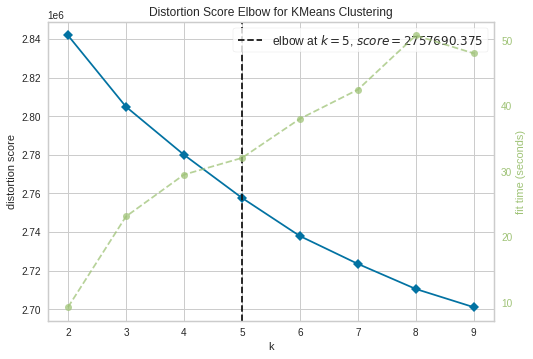

5


In [ ]:
labels, elbow = compute_mini_kmeans(embs_array)

In [ ]:
np.unique(labels, return_counts=True) 

(array([0, 1, 2, 3, 4], dtype=int32), array([6045, 8744, 6685, 7351, 8286]))

In [ ]:
words_clusters = dict()
for l,w in zip(labels, words_array):
  if l in words_clusters:
    words_clusters[l].append(w)
  else:
    words_clusters[l] = [w]

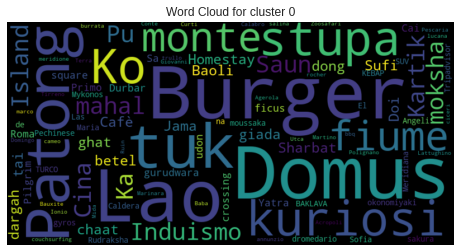

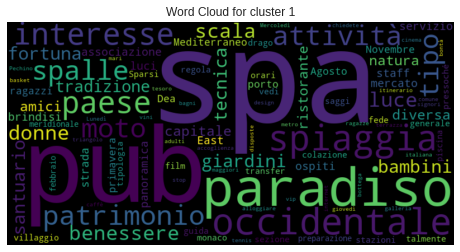

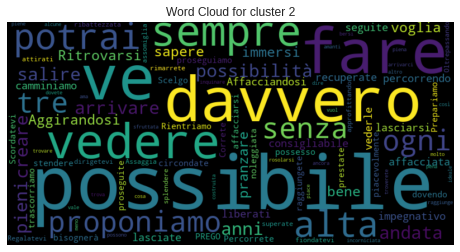

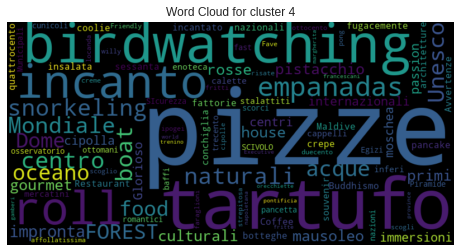

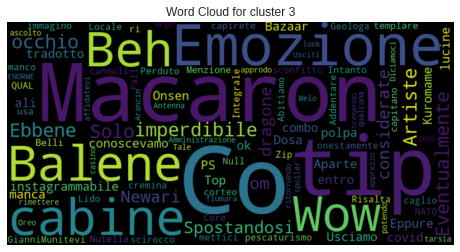

In [ ]:
from wordcloud import WordCloud
for c,w in words_clusters.items():  
  # Create and generate a word cloud image:
  wordcloud = WordCloud(width=800, height=400, max_words = 100).generate(" ".join(w))

  # Display the generated image:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.title("Word Cloud for cluster {}".format(c))
  plt.show()

#### Phase 4: Generation of concept-document matrix CD


In [ ]:
labels

array([0, 1, 2, ..., 3, 2, 4], dtype=int32)

In [ ]:
print(len(dataset_text_tfidf.columns), len(words_array), len(labels))

37067 37111 37111


In [ ]:
CD_list = [[] for i in range(len(tokens))]
for c in range(elbow):
  #retrieve tokens in concept
  tokens_index = np.where(labels == c)
  tokens_in_c = []
  for idx in tokens_index[0]:
    tokens_in_c.append(words_array[idx])
  for d in range(len(tokens)):
    #retrieve TF-IDF for the words
    val = 0
    for t in tokens_in_c:
      try:
        val += dataset_text_tfidf[t].iloc[d]
      except:
        continue
    CD_list[d].append(val)

In [ ]:
CD_matrix = np.array(CD_list)

In [ ]:
CD_matrix.shape

(2000, 5)

#### Phase 5: Clustering of the CD matrix

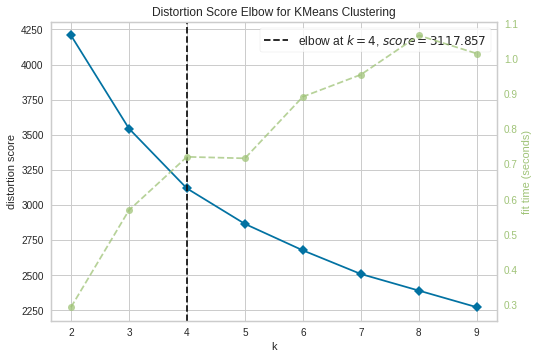

4


In [ ]:
final_labels, final_elbow = compute_mini_kmeans(CD_matrix)

#### Results

In [ ]:
np.unique(final_labels, return_counts=True)

(array([0, 1, 2, 3], dtype=int32), array([580, 380, 652, 388]))

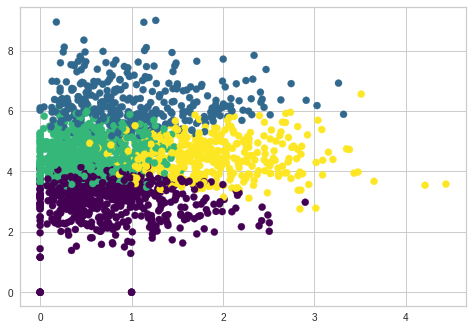

In [ ]:
plt.scatter(CD_matrix[:, 0], CD_matrix[:, 1], c=final_labels, s=50, cmap='viridis')

In [ ]:
docs_clusters = dict()
for i, l in enumerate(final_labels):
  doc = df_schede.description.iloc[[i]].to_string()
  if l in docs_clusters:
    docs_clusters[l].append(doc)
  else:
    docs_clusters[l] = [doc]

In [ ]:
view = 5
for c,d in docs_clusters.items():
  print("First {} documents in cluster {}".format(view,c))
  for i in range(view):
    print(d[i])
    print("-"*100)
  print("#"*100)  

First 5 documents in cluster 2
0    Phuket, il paradiso per gli amanti del sole, d...
----------------------------------------------------------------------------------------------------
2    Nel cuore dello Sri Lanka, nella zona centrale...
----------------------------------------------------------------------------------------------------
10    Quando siamo partiti per il nostro viaggio di ...
----------------------------------------------------------------------------------------------------
12    Tra tutti i mercati in Thailandia quello che c...
----------------------------------------------------------------------------------------------------
21    Il Blue Lassi non è un semplice posto in cui f...
----------------------------------------------------------------------------------------------------
####################################################################################################
First 5 documents in cluster 0
1    So che dietro queste cose c’è spesso del marci...

# LDA

In [ ]:
!pip install pyLDAvis

     |████████████████████████████████| 1.7 MB 3.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=bde71bdbf5e050b84d31addfa8691e7b07f40e73685b848c3f40d69aa0cc6744
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [ ]:
import gensim
from gensim.test.utils import common_corpus, common_dictionary
import os
import ast

In [ ]:
texts = list(data.description)
for i,t in enumerate(texts):
  texts[i]= ast.literal_eval(t)
id2word = gensim.corpora.Dictionary(texts)
corpus = [id2word.doc2bow(t) for t in texts]

In [ ]:
# number of topics
num_topics = 30
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Print the Keyword in the topics
print(lda_model.print_topics())
doc_lda = lda_model[corpus]

In [ ]:
import pyLDAvis.gensim_models
import pyLDAvis
# Visualize the topics
#pyLDAvis.enable_notebook()
LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds='mmds')
pyLDAvis.display(LDAvis_prepared)

# Top2Vec

In [ ]:
!pip install top2vec

     |████████████████████████████████| 24.1 MB 1.2 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [ ]:
from top2vec import Top2Vec

In [ ]:
model = Top2Vec(documents=list(df_schede.description), speed="learn")

2022-05-10 08:30:26,627 - top2vec - INFO - Pre-processing documents for training
2022-05-10 08:30:32,848 - top2vec - INFO - Creating joint document/word embedding
2022-05-10 08:32:41,462 - top2vec - INFO - Creating lower dimension embedding of documents
2022-05-10 08:32:54,170 - top2vec - INFO - Finding dense areas of documents
2022-05-10 08:32:54,286 - top2vec - INFO - Finding topics


In [ ]:
model.get_num_topics()

36

get_topic_sizes returns:

- topic_sizes: The number of documents most similar to each topic.

- topic_nums: The unique index of every topic will be returned.

In [ ]:
topic_sizes, topic_nums = model.get_topic_sizes()
for ts,tn in zip(topic_sizes, topic_nums):
  print("Topic {} has {} documents".format(tn,ts))

Topic 0 has 412 documents
Topic 1 has 354 documents
Topic 2 has 276 documents
Topic 3 has 256 documents
Topic 4 has 232 documents
Topic 5 has 207 documents
Topic 6 has 193 documents
Topic 7 has 188 documents
Topic 8 has 179 documents
Topic 9 has 142 documents
Topic 10 has 141 documents
Topic 11 has 139 documents
Topic 12 has 120 documents
Topic 13 has 117 documents
Topic 14 has 116 documents
Topic 15 has 112 documents
Topic 16 has 103 documents
Topic 17 has 101 documents
Topic 18 has 100 documents
Topic 19 has 99 documents
Topic 20 has 97 documents
Topic 21 has 97 documents
Topic 22 has 86 documents
Topic 23 has 84 documents
Topic 24 has 81 documents
Topic 25 has 78 documents
Topic 26 has 75 documents
Topic 27 has 72 documents
Topic 28 has 66 documents
Topic 29 has 60 documents
Topic 30 has 59 documents
Topic 31 has 48 documents
Topic 32 has 43 documents
Topic 33 has 41 documents
Topic 34 has 39 documents
Topic 35 has 34 documents


get_topics returns:

- topic_words: For each topic the top 50 words are returned, in order of semantic similarity to topic.

- word_scores: For each topic the cosine similarity scores of the top 50 words to the topic are returned.

- topic_nums: The unique index of every topic will be returned.

In [ ]:
topic_words, word_scores, topic_nums = model.get_topics(1)
topic_words, word_scores, topic_nums

(array([['sushi', 'menu', 'cucina', 'locale', 'ristorante', 'bancone',
         'porzioni', 'antipasti', 'pietanze', 'piatti', 'personale',
         'accogliente', 'chef', 'sapori', 'cena', 'selezione', 'qualita',
         'tartare', 'cocktail', 'formula', 'ordinare', 'location',
         'tavoli', 'hamburger', 'buono', 'tavolo', 'ricette', 'manzo',
         'gentile', 'antipasto', 'pesce', 'camerieri', 'aperitivo',
         'salmone', 'clienti', 'ravioli', 'verdure', 'carne', 'baccala',
         'staff', 'curato', 'crudo', 'croccante', 'giapponese',
         'arredamento', 'proposte', 'fritti', 'pollo', 'pizze',
         'proposta']], dtype='<U14'),
 array([[0.44106054, 0.40495387, 0.36915535, 0.36807135, 0.35060945,
         0.34845954, 0.3421073 , 0.3346573 , 0.33406797, 0.33348596,
         0.32637367, 0.31952223, 0.31396103, 0.3093957 , 0.29937166,
         0.29880536, 0.29854336, 0.2972401 , 0.29428902, 0.29403824,
         0.29251742, 0.2922124 , 0.28951496, 0.2886376 , 0.288041

search_topics returns:

- topic_words: For each topic the top 50 words are returned, in order of semantic similarity to topic.

- word_scores: For each topic the cosine similarity scores of the top 50 words to the topic are returned.

- topic_scores: For each topic the cosine similarity to the search keywords will be returned.

- topic_nums: The unique index of every topic will be returned.

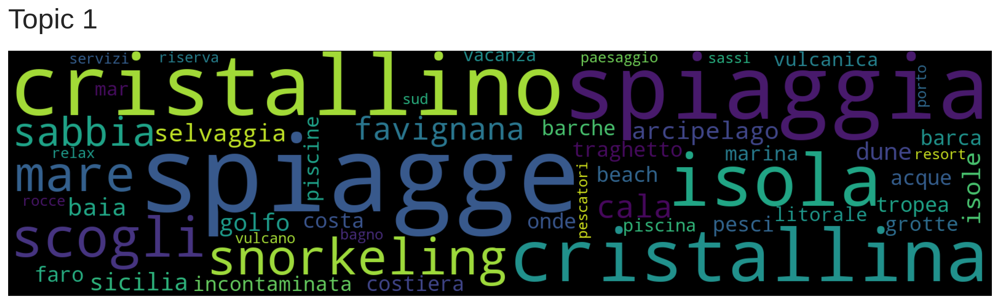

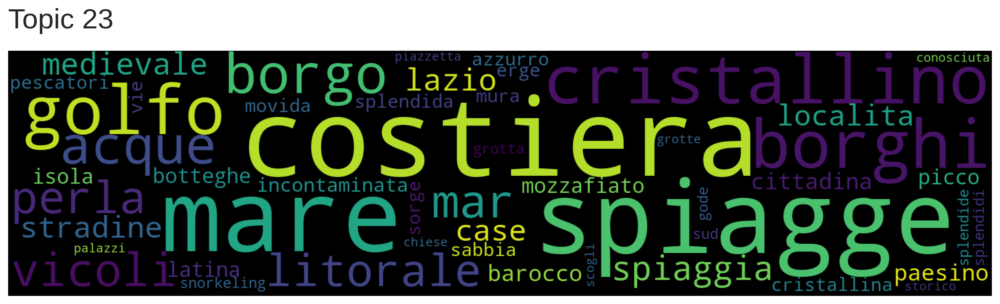

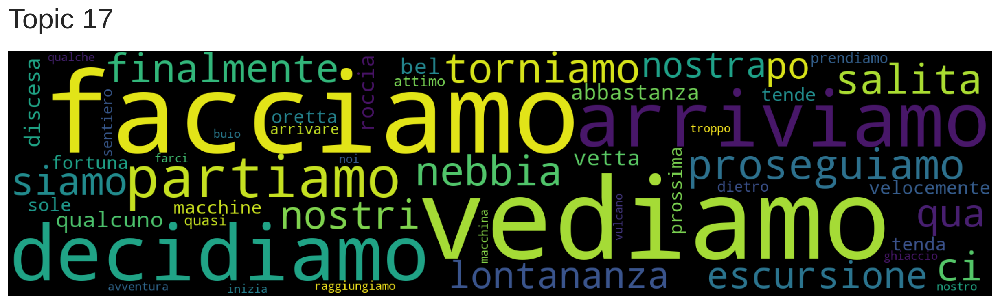

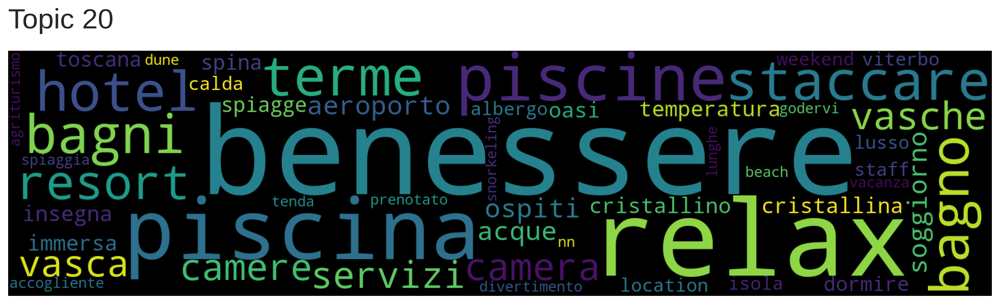

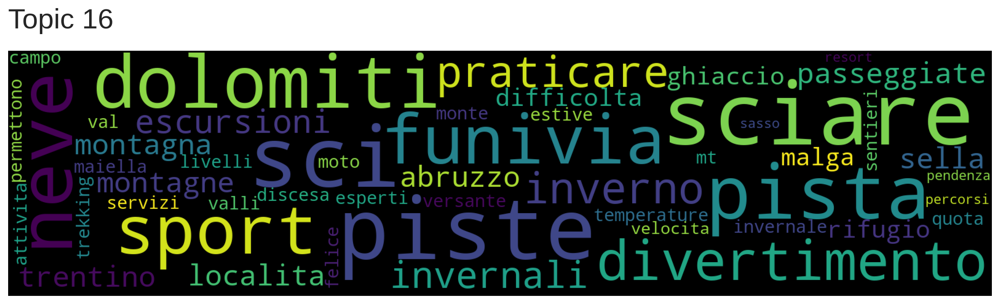

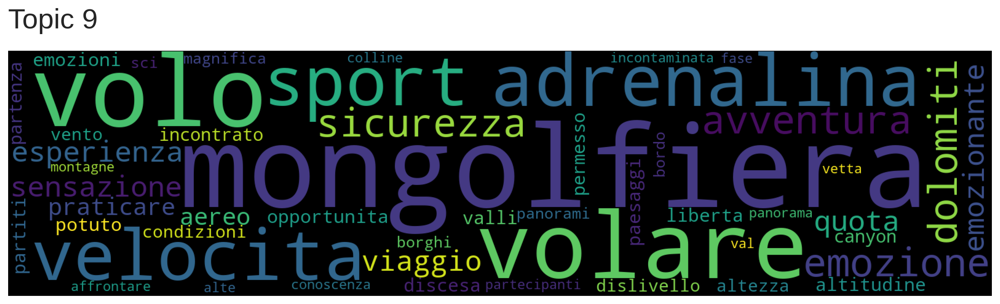

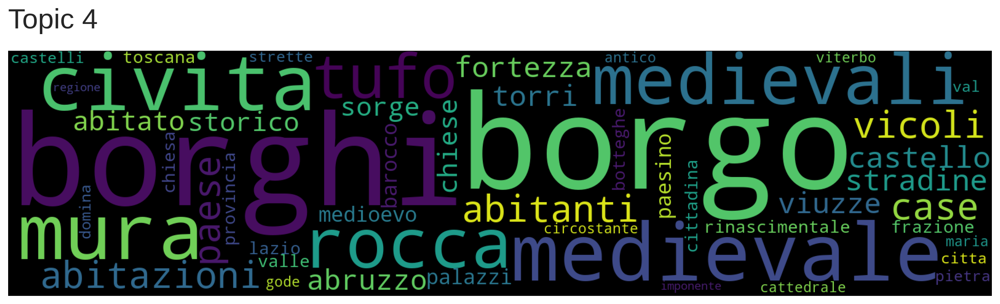

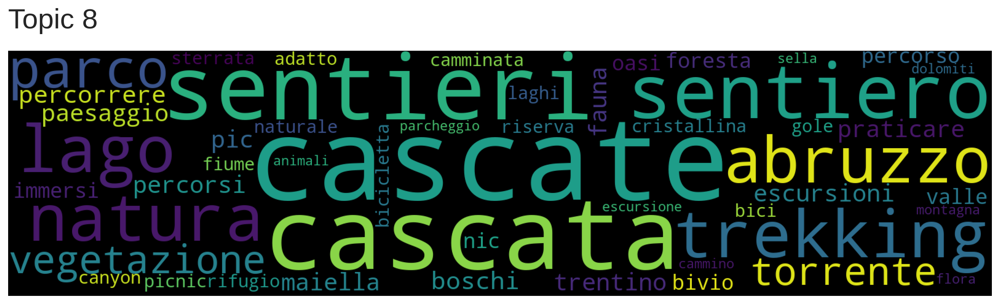

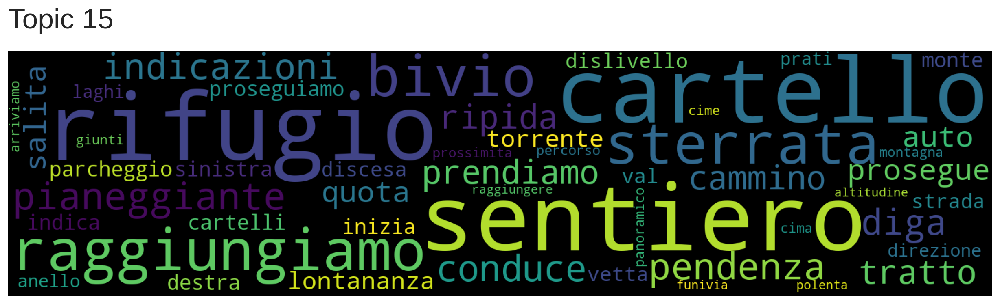

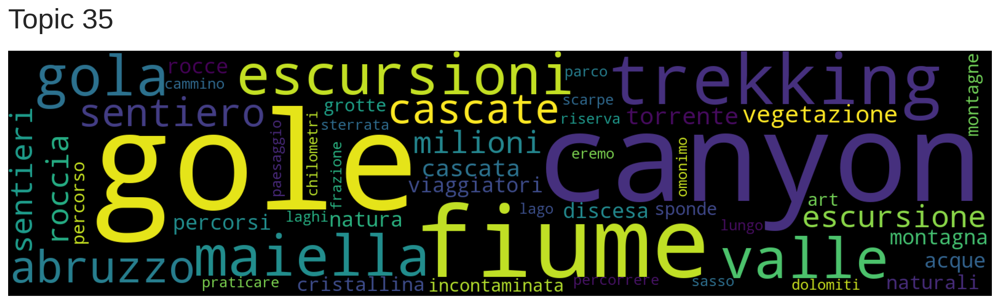

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["mare"], num_topics=10)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

search_documents_by_topic returns:

- documents: The documents in a list, the most similar are first.

- doc_scores: Semantic similarity of document to topic. The cosine similarity of the document and topic vector.

- doc_ids: Unique ids of documents. If ids were not given, the index of document in the original corpus

In [ ]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=17, num_docs=5)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 3186, Score: 0.6957519054412842
-----------
Questa esperienza rientra sempre nella raccolta “trek&foliage”: siamo sempre in Casentino, ma questa volta nei pressi dell’eremo di Camaldoli: non passeremo proprio di lì in questo giro ma presto vi racconterò anche di quando sono riuscito a trovarlo in un mare di nebbia. Una particolarità di questa zona è che una parte della foresta è popolata da una numerosa famiglia di abeti bianchi: cosa di cui ci si può accorgere quando respirando a pieni polmoni ci si sente pervadere da un dolce aroma di resina… e in un attimo è subito Natale!
Ma torniamo a noi… di nuovo ci troviamo on the road nelle strade del casentino: un sacco di curve per la mia felicità, ma sono disposto a pagare il prezzo della lunga camminata che ci aspetta. Puntiamo il rifugio Fangacci, un piccolo rifugio immerso nel bosco, quando attivo ha una piccola foresteria ed è possibile noleggiare un po’ di attrezzatura (ciaspole, e-bike, mountain-bike): lo troviamo in fondo a

# BERTopic

In [ ]:
!pip install bertopic
!pip install distributed==2021.9.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 58 kB 4.3 MB/s 
     |████████████████████████████████| 84 kB 3.2 MB/s 
     |████████████████████████████████| 88 kB 8.9 MB/s 
     |████████████████████████████████| 636 kB 61.2 MB/s 
     |████████████████████████████████| 5.2 MB 50.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.2 MB 23.7 MB/s 
     |████████████████████████████████| 1.1 MB 59.3 MB/s 
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2342108 sha256=09af607c20b087844cab2d9a4e8e9d9c304f5ba695d35ce1cad5067b30024ad4
  Stored in directory: /root/.cache/pip/wheels/6e/7a/5e/259ccc841c085fc41b99ef4a71e896b62f5161f2bc8a14c97a
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.1-py3-none-any.whl size=

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 779 kB 9.5 MB/s 
     |████████████████████████████████| 1.0 MB 55.6 MB/s 
  Attempting uninstall: cloudpickle
    Found existing installation: cloudpickle 1.3.0
    Uninstalling cloudpickle-1.3.0:
      Successfully uninstalled cloudpickle-1.3.0
  Attempting uninstall: dask
    Found existing installation: dask 2.12.0
    Uninstalling dask-2.12.0:
      Successfully uninstalled dask-2.12.0
  Attempting uninstall: distributed
    Found existing installation: distributed 1.25.3
    Uninstalling distributed-1.25.3:
      Successfully uninstalled distributed-1.25.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.1.0 which is incompatible.


In [ ]:
from bertopic import BERTopic
topic_model = BERTopic(language="multilingual", calculate_probabilities=True)

In [ ]:
topics, probs = topic_model.fit_transform(data.description_processed)
#topics, probs = topic_model.fit_transform(data.description)

Downloading:   0%|          | 0.00/968 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.79k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/645 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/471M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/480 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/14.8M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,2805,-1_pot_star_ristor_mar
1,0,234,0_muse_oper_arte_artist
2,1,161,1_star_viagg_pot_stor
3,2,141,2_rom_vill_piazz_colosse
4,3,114,3_person_poll_gioc_man
...,...,...,...
62,61,11,61_lampredott_cremol_gr_zuccher
63,62,11,62_sentier_rifug_alpe_betull
64,63,11,63_heineken_experienc_sfoglin_circ
65,64,10,64_angel_pont_marm_vol


In [ ]:
topic_model.get_topic(25)

[('cuor', 0.032674415146577686),
 ('piatt', 0.025066489365835047),
 ('30', 0.01840868881105417),
 ('cucin', 0.01620308254109398),
 ('romed', 0.014836862812204199),
 ('santuar', 0.01361128681249659),
 ('rion', 0.013132451623753781),
 ('ingress', 0.013006505040106626),
 ('quart', 0.012861622030825658),
 ('san', 0.012709689606302439)]

In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_barchart()

In [ ]:
topic_model.visualize_distribution(probs[200], min_probability=0.0015)

In [ ]:
topic_model.visualize_hierarchy(top_n_topics=50)

In [ ]:
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [ ]:
similar_topics, similarity = topic_model.find_topics("sole", top_n=5); similar_topics

[56, 36, 16, -1, 62]

In [ ]:
topic_model.get_topic(17)

[('animal', 0.06597436976846428),
 ('forest', 0.04472727529980568),
 ('elef', 0.03277146950783515),
 ('natur', 0.02636349330844383),
 ('parc', 0.023714792056952094),
 ('bioparc', 0.023001503931758958),
 ('zoo', 0.020242826309066018),
 ('malg', 0.019437908971959357),
 ('erem', 0.01755565434939774),
 ('alber', 0.01604714798681566)]

#Combined Topic Modelling

In [ ]:
%%capture
!pip install contextualized-topic-models==2.3.0

In [ ]:
%%capture
!pip install pyldavis

In [ ]:
from contextualized_topic_models.models.ctm import CombinedTM
from contextualized_topic_models.utils.data_preparation import TopicModelDataPreparation
from contextualized_topic_models.utils.preprocessing import WhiteSpacePreprocessingStopwords
import nltk
nltk.download('punkt')

from nltk.corpus import stopwords
nltk.download('stopwords')
ita_stopwords = set(nltk.corpus.stopwords.words('italian'))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
sp = WhiteSpacePreprocessingStopwords(df_schede.description, stopwords_list=ita_stopwords)#.iloc[:2000]
preprocessed_documents, unpreprocessed_corpus, vocab, retained_indices = sp.preprocess()

In [ ]:
tp = TopicModelDataPreparation("distiluse-base-multilingual-cased")

training_dataset = tp.fit(text_for_contextual=unpreprocessed_corpus, text_for_bow=preprocessed_documents)

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/114 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.37k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/607 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/341 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/539M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/528 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/996k [00:00<?, ?B/s]

Batches:   0%|          | 0/24 [00:00<?, ?it/s]

In [ ]:
ctm = CombinedTM(bow_size=len(tp.vocab), contextual_size=512, n_components=20, num_epochs=10)
ctm.fit(training_dataset) # run the model

Epoch: [10/10]	 Seen Samples: [46270/46270]	Train Loss: 682.1315640955938	Time: 0:00:01.491158: : 10it [00:23,  2.34s/it]
Sampling: [20/20]: : 20it [00:25,  1.28s/it]


In [ ]:
ctm.get_topic_lists(5)

[['parte', 'circa', 'piu', 'paese', 'visitare'],
 ['menu', 'qualita', 'locale', 'ristorante', 'piatti'],
 ['umanita', 'originali', 'cenare', 'quell', 'albergo'],
 ['sentiero', 'circa', 'fino', 'metri', 'parte'],
 ['bancone', 'ottimo', 'location', 'ricette', 'alti'],
 ['locale', 'menu', 'ogni', 'altro', 'solo'],
 ['citta', 'centro', 'visita', 'visitare', 'piazza'],
 ['san', 'chiesa', 'basilica', 'cappella', 'secolo'],
 ['qualita', 'bancone', 'super', 'ravioli', 'accogliente'],
 ['immagine', 'umanita', 'biglietti', 'diretti', 'quell'],
 ['piu', 'molto', 'prima', 'perche', 'locale'],
 ['piu', 'centro', 'citta', 'visitare', 'parte'],
 ['umanita', 'gatti', 'concerti', 'biglietti', 'migliaia'],
 ['perche', 'molto', 'prima', 'fare', 'quindi'],
 ['selvaggia', 'mongolfiera', 'diretti', 'quell', 'end'],
 ['citta', 'piazza', 'centro', 'piu', 'visitare'],
 ['quell', 'barche', 'percorsi', 'end', 'baia'],
 ['citta', 'piu', 'perche', 'molto', 'visitare'],
 ['parte', 'circa', 'prima', 'dopo', 'spiaggi

In [ ]:
lda_vis_data = ctm.get_ldavis_data_format(tp.vocab, training_dataset, n_samples=10)

Sampling: [10/10]: : 10it [00:12,  1.29s/it]


In [ ]:
import pyLDAvis as vis

lda_vis_data = ctm.get_ldavis_data_format(tp.vocab, training_dataset, n_samples=10)

ctm_pd = vis.prepare(**lda_vis_data)
vis.display(ctm_pd)

Sampling: [10/10]: : 10it [00:12,  1.28s/it]


In [ ]:
topics_predictions = ctm.get_thetas(training_dataset, n_samples=5) # get all the topic predictions

Sampling: [5/5]: : 5it [00:06,  1.27s/it]


In [ ]:
preprocessed_documents[0] # see the text of our preprocessed document

'paradiso amanti sole mare ama sotto sole cocktail vista mare grandi troppo costruita turista cosi alcune zone isola turista occidentale cosa proprio piace spiagge sabbia bianca acqua piene hotel sfondo esattamente ideale spiaggia piena spiagge piu turistiche possono trovare piccoli piu ancora abbastanza dire troverete spiaggia magari meno alberi invece hotel vicino trova meravigliosa beach piccola baia raggiunge percorso discesa insomma ve dovete vale pena perche percorso davvero molto suggestivo sabbia bianca acqua colori possibile arrivarci beach sara piu barche acqua beach piu nord verso altro piccola tranquilla circondata vegetazione qui arrivarci bisogna scendere piccolo breve sentiero alberi gradini direttamente spiaggia puo fare snorkeling vedere molti pesci colorati comprare qualcosa fare passeggiata circostante altra spiaggia ancora abbastanza selvaggia pero stati beach parte sud foto visto qui sembra davvero pena andarci insomma sicuramente molto turistica ancora riesce trov

In [ ]:
import numpy as np
topic_number = np.argmax(topics_predictions[0]) # get the topic id of the first document

In [ ]:
topic_number

13

In [ ]:
ctm.get_topic_lists(5)[18]

['parte', 'circa', 'prima', 'dopo', 'spiaggia']

In [ ]:
ctm.get_topic_lists(5)[topic_number] 

['perche', 'molto', 'prima', 'fare', 'quindi']

# Texts + Images

In [ ]:
from os import listdir
from os.path import isfile, join

In [ ]:
folder = "/content/drive/MyDrive/Tesi/images_small"
images = [join(folder, f) for f in listdir(folder) if isfile(join(folder, f))]

In [ ]:
!pip install -qqq -U sentence-transformers bert-extractive-summarizer sacremoses

     |████████████████████████████████| 85 kB 3.6 MB/s 
     |████████████████████████████████| 880 kB 45.8 MB/s 
     |████████████████████████████████| 1.2 MB 38.1 MB/s 


## CLIP

In [ ]:
from PIL import Image
import requests

from transformers import CLIPTokenizer, CLIPTextModel, CLIPProcessor, CLIPVisionModel
from summarizer.sbert import SBertSummarizer
from sentence_transformers import SentenceTransformer

In [ ]:
pretrained_it = "clip-italian/clip-italian"
pretrained_openai = "openai/clip-vit-base-patch32"

Texts embeddings

In [ ]:
def get_documents(df_documents, model, num_docs=0, number_sentences=8):
  if num_docs != 0:
    texts = df_documents.iloc[:num_docs]
  else:
    texts = df_documents
  df_summarized = texts.apply(lambda article: model(article, num_sentences=number_sentences))
  return df_summarized.tolist()

In [ ]:
model_text = CLIPTextModel.from_pretrained("openai/clip-vit-base-patch32") 
tokenizer_text = CLIPTokenizer.from_pretrained("openai/clip-vit-base-patch32")
model_summarizer = SBertSummarizer('distiluse-base-multilingual-cased-v1')

summarized_text = get_documents(df_schede.description, model_summarizer, num_docs=4, number_sentences=8)
inputs_text = tokenizer_text(summarized_text, padding=True, return_tensors="pt") #["a photo of a cat", "a photo of a dog"]

outputs_text = model_text(**inputs_text)
last_hidden_state_text = outputs_text.last_hidden_state
pooled_output_text = outputs_text.pooler_output  # pooled (EOS token) states

Images embeddings

In [ ]:
model_image = CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch32")
processor_image = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

img_embeddings = []
for i in images:
  image = Image.open(i)

  inputs_image = processor_image(images=image, return_tensors="pt")

  outputs_image = model_image(**inputs_image)
  last_hidden_state_image = outputs_image.last_hidden_state
  pooled_output_image = outputs_image.pooler_output  # pooled CLS states
  img_embeddings.append(pooled_output_image)

Some weights of the model checkpoint at openai/clip-vit-base-patch32 were not used when initializing CLIPVisionModel: ['text_model.encoder.layers.3.layer_norm2.weight', 'text_model.encoder.layers.0.self_attn.out_proj.bias', 'text_model.encoder.layers.6.layer_norm1.bias', 'text_model.encoder.layers.1.self_attn.k_proj.bias', 'text_model.encoder.layers.9.mlp.fc2.weight', 'text_model.encoder.layers.9.self_attn.out_proj.weight', 'text_model.encoder.layers.7.self_attn.q_proj.bias', 'text_model.encoder.layers.11.self_attn.v_proj.weight', 'text_model.encoder.layers.10.layer_norm1.bias', 'text_model.encoder.layers.1.self_attn.v_proj.weight', 'text_model.encoder.layers.3.mlp.fc2.weight', 'text_model.encoder.layers.11.mlp.fc1.bias', 'text_model.encoder.layers.10.layer_norm1.weight', 'text_model.encoder.layers.2.layer_norm1.bias', 'text_model.encoder.layers.0.self_attn.v_proj.bias', 'text_model.encoder.layers.2.mlp.fc1.weight', 'visual_projection.weight', 'text_model.encoder.layers.1.self_attn.out

In [ ]:
img_embeddings[0]

## Vision Text Dual Encoder

https://huggingface.co/docs/transformers/v4.20.1/en/model_doc/vision-text-dual-encoder

In [ ]:
from PIL import Image
import requests
from transformers import (
    VisionTextDualEncoderModel,
    VisionTextDualEncoderProcessor,
    ViTFeatureExtractor,
    BertTokenizer,
)

In [ ]:
def get_documents(df_documents, model, limit=0):
  if limit != 0:
    texts = df_documents.iloc[:limit]
  else:
    texts = df_documents
  df_summarized = texts.apply(lambda article: model(article, num_sentences=8))
  return df_summarized.tolist()

In [ ]:
def get_text_image_pairs(schede):
  texts_input = []
  images_input = []
  for i,media in zip(schede.description, schede.media):
    if not media["photos"]:
      print("One scheda does not have photos")
      continue
    for p in media["photos"]:
      #print(p["fileId"])
      texts_input.append(i)
      images_input.append(Image.open(join(folder, p["fileId"])))
  return texts_input, images_input

In [ ]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")
processor = VisionTextDualEncoderProcessor(feature_extractor, tokenizer)
model = VisionTextDualEncoderModel.from_vision_text_pretrained(
    "google/vit-base-patch16-224", "bert-base-uncased"
)

texts_input, images_input = get_text_image_pairs(df_schede)
inputs = processor(text=texts_input, images=images_input, return_tensors="pt", padding=True)

outputs = model(
    input_ids=inputs.input_ids,
    attention_mask=inputs.attention_mask,
    pixel_values=inputs.pixel_values,
    return_loss=False,
)

text_embeds, image_embeds = outputs.text_embeds, outputs.image_embeds
text_model_output, image_model_output = outputs.text_model_output, outputs.text_model_output

In [ ]:
text_embeds, image_embeds

(tensor([[-0.0246,  0.0254,  0.0223,  ..., -0.0660,  0.0594,  0.0119],
         [-0.0286,  0.0319,  0.0228,  ..., -0.0531,  0.0502,  0.0373]],
        grad_fn=<DivBackward0>),
 tensor([[-0.0084, -0.0714, -0.0522,  ...,  0.0158,  0.0424, -0.0791],
         [ 0.1035,  0.0121, -0.0011,  ..., -0.0283,  0.0219,  0.1015]],
        grad_fn=<DivBackward0>))

## Concept Library -> CLIP + BERTopic

In [ ]:
%clear
!pip install concept
!pip install -U sentence-transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 5.4 MB/s 
     |████████████████████████████████| 5.2 MB 18.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 81 kB 11.8 MB/s 
     |████████████████████████████████| 53 kB 2.3 MB/s 
     |████████████████████████████████| 1.2 MB 56.2 MB/s 
     |████████████████████████████████| 1.1 MB 60.3 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-1.2.0-py3-none-any.whl size=123336 sha256=9d704a4c81fe78c3b58a4184afc626f9ede5f34a2eac2f5a05d5888f0e19d4b6
  Stored in directory: /root/.cache/pip/wheels/5a/34/6c/17406cadd88634de11a062015d04d1de556b45c9921752805a
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2342166 sha256=43e93ac4dc461e39900951929fd2193638b1935570e

In [ ]:
import random
import nltk
nltk.download("wordnet")
nltk.download('omw-1.4')
from nltk.corpus import wordnet as wn

all_nouns = [word for synset in wn.all_synsets('n') for word in synset.lemma_names() if "_" not in word]
selected_nouns = random.sample(all_nouns, 50_000)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
from os import listdir
from os.path import isfile, join
import glob
import zipfile
from tqdm import tqdm
from sentence_transformers import util

images_folder = "/content/drive/MyDrive/Tesi/images"
img_names = list(glob.glob(images_folder+'/*'))

In [ ]:
len(img_names)

7734

In [ ]:
from concept import ConceptModel

concept_model = ConceptModel() #embedding_model="clip-ViT-B-32-multilingual-v1"
concepts = concept_model.fit_transform(img_names, docs=selected_nouns) 

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/316 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/605M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/389 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/604 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/961k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.88k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

100%|██████████| 61/61 [56:31<00:00, 55.60s/it]


Batches:   0%|          | 0/1172 [00:00<?, ?it/s]

In [ ]:
import numpy as np
concepts_freq = np.unique(np.array(concepts), return_counts=True)
print(concepts_freq)
concepts_list = list(concepts_freq[0])
concepts_list.remove(-1)
print(concepts_list)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7]), array([ 315,   42,   36,  121,   66,   32, 5944,  137, 1041]))
[0, 1, 2, 3, 4, 5, 6, 7]


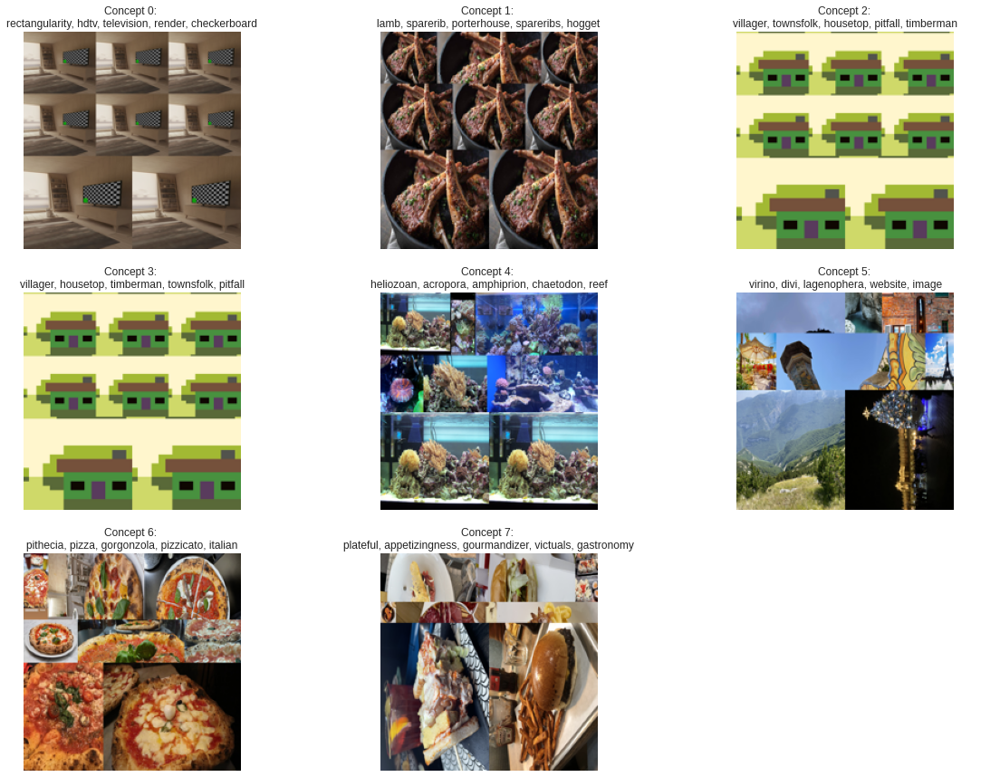

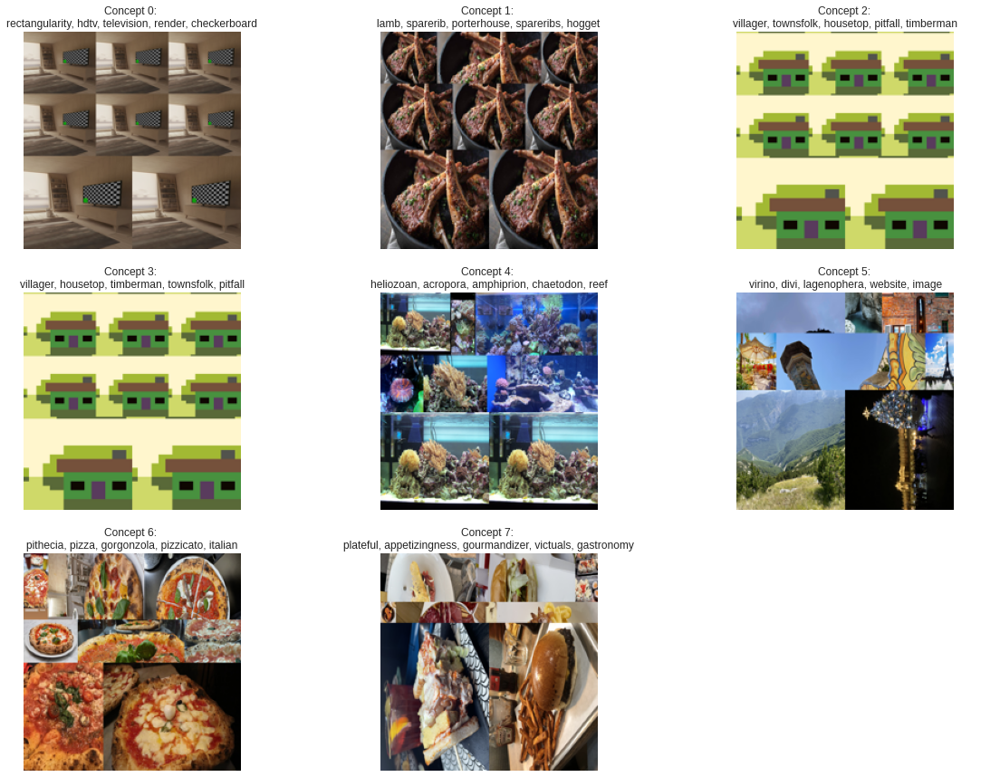

In [ ]:
concept_model.visualize_concepts(concepts=concepts_list)

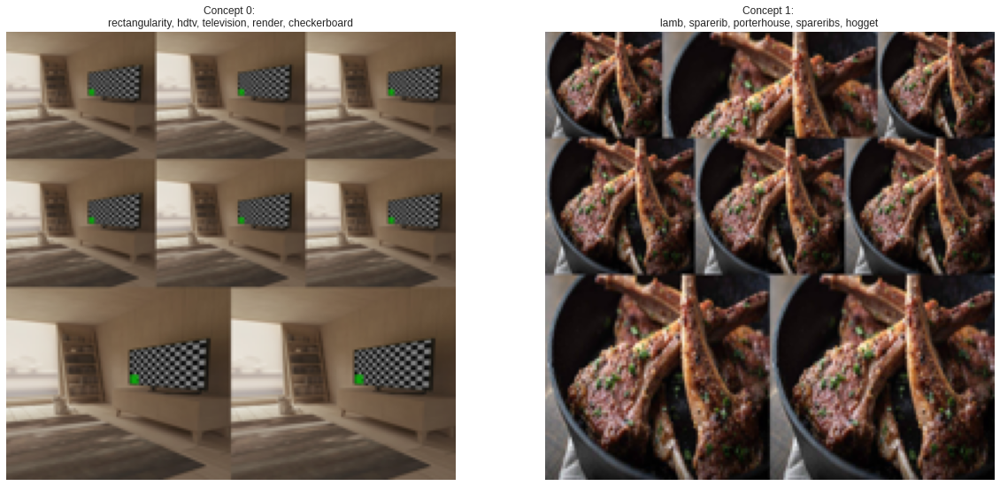

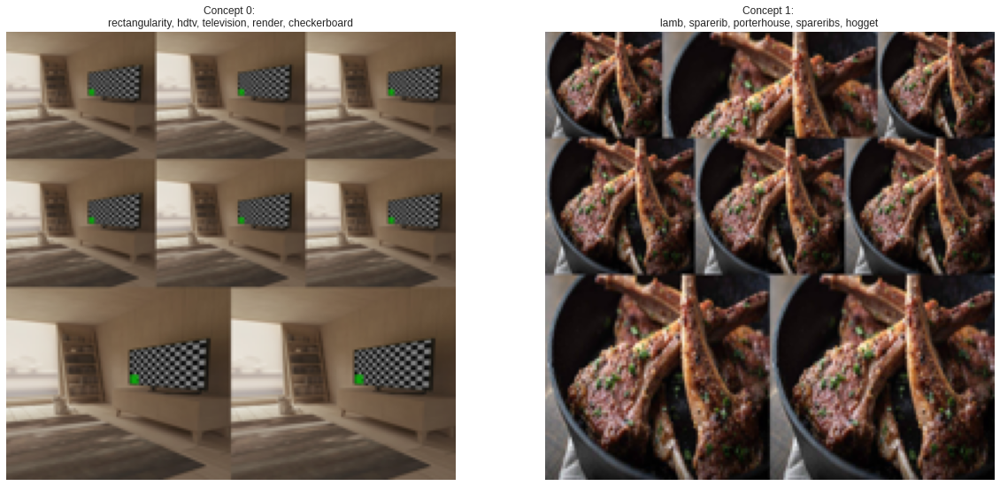

In [ ]:
concept_model.visualize_concepts(concepts=[0,1])

In [ ]:
concept_model.find_concepts("spiaggia")

[(5, 0.26442772393380487),
 (7, 0.23060777104001945),
 (6, 0.219193780379409),
 (4, 0.2042810991624901),
 (3, 0.18184264922180352)]

## CCA

<h1>Problem:</h1> <h3>It works just on pairs (image,text), so the two dataset should have the same number of samples. </h3>

In [ ]:
import numpy as np
from sklearn.cross_decomposition import CCA

Texts

In [ ]:
X = declutr_emb
X_mc = (X-X.mean())/(X.std())

Images

In [ ]:
model_image = CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch32")
processor_image = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

img_embeddings = []
for i in images[:100]:
  image = Image.open(i)

  inputs_image = processor_image(images=image, return_tensors="pt")

  outputs_image = model_image(**inputs_image)
  last_hidden_state_image = outputs_image.last_hidden_state
  pooled_output_image = outputs_image.pooler_output  # pooled CLS states
  img_embeddings.append(pooled_output_image)

Downloading:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/577M [00:00<?, ?B/s]

Some weights of the model checkpoint at openai/clip-vit-base-patch32 were not used when initializing CLIPVisionModel: ['text_model.encoder.layers.5.self_attn.v_proj.bias', 'text_model.encoder.layers.10.self_attn.v_proj.bias', 'text_model.encoder.layers.3.layer_norm1.weight', 'text_model.encoder.layers.11.mlp.fc2.bias', 'text_model.encoder.layers.7.layer_norm2.weight', 'text_model.encoder.layers.8.mlp.fc1.weight', 'text_model.encoder.layers.3.layer_norm1.bias', 'text_model.encoder.layers.1.layer_norm1.weight', 'text_model.encoder.layers.2.mlp.fc1.bias', 'text_model.encoder.layers.3.self_attn.q_proj.bias', 'text_model.encoder.layers.0.self_attn.out_proj.weight', 'text_model.encoder.layers.11.mlp.fc2.weight', 'text_model.encoder.layers.11.layer_norm1.bias', 'text_model.encoder.layers.6.mlp.fc1.bias', 'text_model.encoder.layers.7.self_attn.v_proj.weight', 'text_model.encoder.layers.1.mlp.fc1.weight', 'text_model.encoder.layers.8.mlp.fc1.bias', 'text_model.encoder.layers.4.mlp.fc1.weight', 

Downloading:   0%|          | 0.00/316 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/568 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/842k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/512k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.12M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
len = len(img_embeddings)
for i in range(len):
  img_embeddings[i] = img_embeddings[i].cpu().detach().numpy()
Y = np.array(img_embeddings)
Y_mc = (Y-Y.mean())/(Y.std())

In [ ]:
ca = CCA()
ca.fit(X_mc, Y_mc)
X_c, Y_c = ca.transform(X_mc, Y_mc)

ValueError: ignored

## Data2Vec

Paper -> https://arxiv.org/pdf/2202.03555.pdf

HF -> https://huggingface.co/docs/transformers/model_doc/data2vec#transformers.Data2VecTextModel

In [ ]:
from transformers import RobertaTokenizer, Data2VecTextModel
from transformers import BeitFeatureExtractor, Data2VecVisionModel
from summarizer.sbert import SBertSummarizer
import torch
from PIL import Image

In [ ]:
def get_documents(df_documents, model, num_docs=0, number_sentences=8):
  if num_docs != 0:
    texts = df_documents.iloc[:num_docs]
  else:
    texts = df_documents
  df_summarized = texts.apply(lambda article: model(article, num_sentences=number_sentences))
  return df_summarized.tolist()

Max number of tokens admitted is 514 -> summarize texts to 8 sentence is generally enough (add truncation anyway because sometimes the limit is exceeded) 

In [ ]:
tokenizer = RobertaTokenizer.from_pretrained("facebook/data2vec-text-base")
model_text = Data2VecTextModel.from_pretrained("facebook/data2vec-text-base")
model_summarizer = SBertSummarizer('distiluse-base-multilingual-cased-v1')

summarized_texts = get_documents(df_schede.description, model_summarizer, num_docs=0, number_sentences=8)
inputs_text = tokenizer(summarized_texts, padding=True, truncation=True, return_tensors="pt") 
outputs_text = model_text(**inputs_text)

text_last_hidden_states = outputs_text.last_hidden_state
text_pooler_output = outputs_text.pooler_output

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.09k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/714 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/476M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/data2vec-text-base were not used when initializing Data2VecTextModel: ['lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.dense.weight', 'lm_head.bias']
- This IS expected if you are initializing Data2VecTextModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Data2VecTextModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Data2VecTextModel were not initialized from the model checkpoint at facebook/data2vec-text-base and are newly initialized: ['data2vec_text.pooler.dense.weight', 'data2vec_text.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it f

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/114 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.38k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/556 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/539M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/452 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/996k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/341 [00:00<?, ?B/s]

In [ ]:
text_pooler_output.shape

In [ ]:
feature_extractor = BeitFeatureExtractor.from_pretrained("facebook/data2vec-vision-base")
model_vision = Data2VecVisionModel.from_pretrained("facebook/data2vec-vision-base", add_pooling_layer=True)

img = Image.open(images[0])
inputs_vision = feature_extractor(img, return_tensors="pt")

with torch.no_grad():
    outputs_vision = model_vision(**inputs_vision)

vision_last_hidden_states = outputs_vision.last_hidden_state
vision_pooler_output = outputs_vision.pooler_output

In [ ]:
vision_pooler_output.shape